# import / def #

In [14]:
# import
import matplotlib.pyplot as plt
import numpy as np
import uproot
from scipy.optimize import curve_fit
import scipy.special as sp
plt.style.use('nexo_new.mplstyle')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

In [15]:
def uproot_data_mc(
                    file,
                    keyMC = 'energy_ss_ss_mc;1', keyData = 'energy_ss_ss_data;1'
                    ):
    #use uproot to get values
    roo = uproot.open(file)
    mc = roo[keyMC]
    data = roo[keyData]
    return mc, data
def errorprop_sum(list_of_errors):
    l = []
    for i in range(len(list_of_errors)):
        l.append(list_of_errors[i]**2)
    return np.sqrt(np.sum(l))/len(l)

In [16]:
def plot_nice_agreement(
                        file, 
                        keyMC = 'energy_ss_ss_mc;1', keyData = 'energy_ss_ss_data;1',
                        color=[colors[3],colors[1],colors[2]], 
                        xrange = [0,3500],
                        yrange = None,
                        title = "Shape Agreement", 
                        ratiorange = [0.75,1.25],
                        res = False,
                        log = False
                       ):
    mc, data = uproot_data_mc(file, keyMC, keyData)
    mc_a = mc.to_numpy()
    bin_edges = mc_a[1]
    bin_centers = [(bin_edges[i]+bin_edges[i+1])/2 for i in range(len(bin_edges)-1)] #assuming binning is the same for MC and data, which it *should* be
    eMC = mc_a[0]
    data_a = data.to_numpy()
    eData = data_a[0]
    #plot
    fig, ax = plt.subplots(figsize=(8,6), ncols=1, nrows=2, sharex=True, facecolor='white', gridspec_kw={'height_ratios': [3, 1]})
    ax[0].set_title(title)
    ax[0].set_ylabel('Normalized Amplitude')
    ax[0].set_xlim(xrange[0],xrange[1])
    if yrange != None:
        ax[0].set_ylim(yrange[0],yrange[1])
    if log:
        ax[0].set_yscale('log')
        ax[0].set_ylim(yrange[0],yrange[1])
        #ax[0].set_ylim(1E-7,1E-1)
    ax[0].errorbar(bin_centers, eMC, yerr=mc.errors(),marker='.', markersize = 5,  linestyle='', label = 'Simulation', color=color[0])
    ax[0].stairs(eMC, bin_edges, color=color[0])
    ax[0].errorbar(bin_centers, eData, yerr=data.errors(), marker='.', markersize = 5, linestyle='',label = 'Data', color=color[1])
    ax[0].stairs(eData, bin_edges, color=color[1])
    ax[1].set_ylim(ratiorange[0],ratiorange[1])
    ax[1].set_xlabel('Energy [keV]')
    ax[0].legend()
    if keyMC == 'energy_all_ssfrac_mc;1':
        ax[0].set_ylabel('SS fraction')
        ax[0].set_ylim(0,1)
    if res:
        ax[1].set_ylabel('(MC-Data)/Data')
        ratio_err = np.sqrt((mc.errors()/eMC)**2 + (data.errors()/eData)**2)
        ax[1].errorbar(bin_centers, (eData-eMC)/eMC, yerr=ratio_err, label='Data', marker = 's', markersize = 2, linestyle='', color=color[2])  
    if not res:
        ax[1].set_ylabel('MC/Data')
        ratio_err = np.sqrt((mc.errors()/eMC)**2 + (data.errors()/eData)**2)
        ax[1].errorbar(bin_centers, eMC/eData, yerr=ratio_err, label='Data', marker = 's', markersize = 2, linestyle='', color=color[2]) 
def get_ssfrac_err(
                        file, 
                        keyMC = 'energy_all_ssfrac_mc;1', keyData = 'energy_all_ssfrac_data;1',
                        xrange = [400,850], 
                        constraint = False,
                        variance = False
                       ):
    #use uproot to get values
    roo = uproot.open(file)
    mc = roo[keyMC]
    data = roo[keyData]
    mc_a = mc.to_numpy()
    bin_edges = mc_a[1]
    bin_centers = [(bin_edges[i]+bin_edges[i+1])/2 for i in range(len(bin_edges)-1)] #assuming binning is the same for MC and data, which it *should* be
    data_a = data.to_numpy()
    eData = data_a[0][(data_a[1][:-1]<xrange[1]) & (data_a[1][:-1]>xrange[0])]
    eMC = mc_a[0][(mc_a[1][:-1]<xrange[1]) & (mc_a[1][:-1]>xrange[0])]
    eData_err = data.errors()[(data_a[1][:-1]<xrange[1]) & (data_a[1][:-1]>xrange[0])]
    eMC_err = mc.errors()[(mc_a[1][:-1]<xrange[1]) & (mc_a[1][:-1]>xrange[0])]
    ratio_err = np.sqrt((eMC_err/eMC)**2 + (eData_err/eData)**2)
    percent_error = np.abs((eData-eMC)/eMC)
    #print(percent_error)
    wgts = 1/ratio_err
    #print(wgts)
    if constraint:
        return np.max(percent_error)
    if variance:
        return np.std(percent_error)
    else:
        return (np.average(percent_error, weights =wgts), errorprop_sum(ratio_err))

In [17]:
def plot_ssfrac_energyss(
                        file, 
                        xrange = [0,3500],
                        clearance = 80,
                        axvline = True,
                        yrange = None,
                        ratiorange = None,
                        colors = [colors[0], colors[1], colors[2]],
                        res = False,
                       ):
    keys = ['energy_ss_ss_mc;1', 'energy_ss_ss_data;1', 'energy_all_ssfrac_mc;1', 'energy_all_ssfrac_data;1']

    #ss fraction
    mc_frac, data_frac = uproot_data_mc(file, keyMC=keys[2], keyData=keys[3])
    mc_frac_a, data_frac_a = mc_frac.to_numpy(), data_frac.to_numpy()
    eMC_frac, eData_frac = mc_frac_a[0], data_frac_a[0]
    bin_edges_frac = mc_frac_a[1]
    bin_centers_frac = [(bin_edges_frac[i]+bin_edges_frac[i+1])/2 for i in range(len(bin_edges_frac)-1)]

    #ss spectra
    mc_ss, data_ss = uproot_data_mc(file, keys[0], keys[1])
    mc_ss_a, data_ss_a = mc_ss.to_numpy(), data_ss.to_numpy()
    eMC_ss, eData_ss = mc_ss_a[0], data_ss_a[0]
    bin_edges_ss = mc_ss_a[1]
    bin_centers_ss = [(bin_edges_ss[i]+bin_edges_ss[i+1])/2 for i in range(len(bin_edges_ss)-1)]
    
    #plot
    if yrange != None:
        ax[1][0].set_ylim(yrange[0],yrange[1])

    fig, ax = plt.subplots(figsize=(12,6), ncols=2, nrows=2, sharex=True, facecolor='white', gridspec_kw={'height_ratios': [3, 1]})

    if axvline:
        ax[0][0].axvline(xrange[1],color = 'black', ls=':')
        ax[0][1].axvline(xrange[1],color = 'black', ls=':')
        ax[1][0].axvline(xrange[1],color = 'black', ls=':')
        ax[1][1].axvline(xrange[1],color = 'black', ls=':')
    
    ax[0][0].set_title('SS Fraction Agreement')
    ax[0][0].set_ylabel('SS fraction')
    ax[0][0].set_xlim(xrange[0],xrange[1]+clearance)
    ax[0][0].set_ylim(0,1)
    ax[0][0].errorbar(bin_centers_frac, eMC_frac, yerr=mc_frac.errors(),marker='.', markersize = 5,  linestyle='', label = 'Simulation', color=colors[0])
    ax[0][0].stairs(eMC_frac, bin_edges_frac, color=colors[0])
    ax[0][0].errorbar(bin_centers_frac, eData_frac, yerr=data_frac.errors(), marker='.', markersize = 5, linestyle='',label = 'Data', color=colors[1])
    ax[0][0].stairs(eData_frac, bin_edges_frac, color=colors[1])
    ax[0][0].legend()
    ax[1][0].set_xlabel('Energy [keV]')
    if res:
        ax[1][0].set_ylabel('(Data-MC)/MC')
        ratio_err = np.sqrt((mc_frac.errors()/eMC_frac)**2 + (data_frac.errors()/eData_frac)**2)
        r = (eData_frac-eMC_frac)/eMC_frac
        if ratiorange == None:
            ax[1][0].set_ylim(-1*np.nanmax(r[:int(((xrange[1]-xrange[0])/20))]),np.nanmax(r[:int(((xrange[1]-xrange[0])/20))]))
        else:
            ax[1][0].set_ylim(ratiorange[0],ratiorange[1])
        ax[1][0].errorbar(bin_centers_frac, r, yerr=ratio_err, label='Data', marker = 's', markersize = 2, linestyle='', color=colors[2])  
    if not res:
        ax[1][0].set_ylabel('MC/Data')
        r = eMC_frac/eData_frac
        ratio_err = np.sqrt((mc_frac.errors()/eMC_frac)**2 + (data_frac.errors()/eData_frac)**2)
        if ratiorange == None:
            ax[1][0].set_ylim(-1*np.nanmax(r[:int(((xrange[1]-xrange[0])/20))]),np.nanmax(r[:int(((xrange[1]-xrange[0])/20))]))
        else:
            ax[1][0].set_ylim(ratiorange[0],ratiorange[1])
        ax[1][0].errorbar(bin_centers_frac, r, yerr=ratio_err, label='Data', marker = 's', markersize = 2, linestyle='', color=colors[2])
    
    ax[0][1].set_title('SS Energy Spectrum Agreement')
    ax[0][1].set_ylabel('Normalized Amplitude')
    ax[0][1].set_xlim(xrange[0],xrange[1]+clearance)
    ax[0][1].errorbar(bin_centers_ss, eMC_ss, yerr=mc_ss.errors(),marker='.', markersize = 5,  linestyle='', label = 'Simulation', color=colors[0])
    ax[0][1].stairs(eMC_ss, bin_edges_ss, color=colors[0])
    ax[0][1].errorbar(bin_centers_ss, eData_ss, yerr=data_ss.errors(), marker='.', markersize = 5, linestyle='',label = 'Data', color=colors[1])
    ax[0][1].stairs(eData_ss, bin_edges_ss, color=colors[1])
    ax[0][1].legend()
    ax[1][1].set_xlabel('Energy [keV]')
    if res:
        ax[1][1].set_ylabel('(Data-MC)/MC')
        ratio_err = np.sqrt((mc_ss.errors()/eMC_ss)**2 + (data_ss.errors()/eData_ss)**2)
        r = (eData_ss-eMC_ss)/eMC_ss
        if ratiorange == None:
            ax[1][1].set_ylim(-1*np.nanmax(r[:int(((xrange[1]-xrange[0])/20))]),np.nanmax(r[:int(((xrange[1]-xrange[0])/20))]))
        else:
            ax[1][1].set_ylim(ratiorange[0],ratiorange[1])
        ax[1][1].errorbar(bin_centers_ss, r, yerr=ratio_err, label='Data', marker = 's', markersize = 2, linestyle='', color=colors[2])  
    if not res:
        ax[1][1].set_ylabel('MC/Data')
        ratio_err = np.sqrt((mc_ss.errors()/eMC_ss)**2 + (data_ss.errors()/eData_ss)**2)
        r = eMC_ss/eData_ss
        if ratiorange == None:
            ax[1][1].set_ylim(-1*np.nanmax(r[:int(((xrange[1]-xrange[0])/20))]),np.nanmax(r[:int(((xrange[1]-xrange[0])/20))]))
        else:
            ax[1][1].set_ylim(ratiorange[0],ratiorange[1])
        ax[1][1].errorbar(bin_centers_ss, r, yerr=ratio_err, label='Data', marker = 's', markersize = 2, linestyle='', color=colors[2]) 
    return ax

In [18]:
def plot_ssfrac_energyss(
                        file, 
                        xrange = [0,3500],
                        clearance = 80,
                        axvline = True,
                        yrange = None,
                        ratiorange = None,
                        colors = [colors[0], colors[1], colors[2]],
                        res = False,
                       ):
    np.seterr(divide='ignore', invalid='ignore')
    
    keys = ['energy_ss_ss_mc;1', 'energy_ss_ss_data;1', 'energy_all_ssfrac_mc;1', 'energy_all_ssfrac_data;1']

    #ss fraction
    mc_frac, data_frac = uproot_data_mc(file, keys[2], keys[3])
    mc_frac_a, data_frac_a = mc_frac.to_numpy(), data_frac.to_numpy()
    eMC_frac, eData_frac = mc_frac_a[0], data_frac_a[0]
    bin_edges_frac = mc_frac_a[1]
    bin_centers_frac = [(bin_edges_frac[i]+bin_edges_frac[i+1])/2 for i in range(len(bin_edges_frac)-1)]

    #ss spectra
    mc_ss, data_ss = uproot_data_mc(file, keys[0], keys[1])
    mc_ss_a, data_ss_a = mc_ss.to_numpy(), data_ss.to_numpy()
    eMC_ss, eData_ss = mc_ss_a[0], data_ss_a[0]
    bin_edges_ss = mc_ss_a[1]
    bin_centers_ss = [(bin_edges_ss[i]+bin_edges_ss[i+1])/2 for i in range(len(bin_edges_ss)-1)]
    
    #plot
    if yrange != None:
        ax[1][0].set_ylim(yrange[0],yrange[1])

    fig, ax = plt.subplots(figsize=(12,6), ncols=2, nrows=2, sharex=True, facecolor='white', gridspec_kw={'height_ratios': [3, 1]})

    if axvline:
        ax[0][0].axvline(xrange[1],color = 'black', ls=':')
        ax[0][1].axvline(xrange[1],color = 'black', ls=':')
        ax[1][0].axvline(xrange[1],color = 'black', ls=':')
        ax[1][1].axvline(xrange[1],color = 'black', ls=':')
    
    ax[0][0].set_title('SS Fraction Agreement')
    ax[0][0].set_ylabel('SS fraction')
    ax[0][0].set_xlim(xrange[0],xrange[1]+clearance)
    ax[0][0].set_ylim(0,1)
    ax[0][0].errorbar(bin_centers_frac, eMC_frac, yerr=mc_frac.errors(),marker='.', markersize = 5,  linestyle='', label = 'Simulation', color=colors[0])
    ax[0][0].stairs(eMC_frac, bin_edges_frac, color=colors[0])
    ax[0][0].errorbar(bin_centers_frac, eData_frac, yerr=data_frac.errors(), marker='.', markersize = 5, linestyle='',label = 'Data', color=colors[1])
    ax[0][0].stairs(eData_frac, bin_edges_frac, color=colors[1])
    ax[0][0].legend()
    ax[1][0].set_xlabel('Energy [keV]')

    
    if res:
        ax[1][0].set_ylabel('(Data-MC)/MC')
        ratio_err = np.sqrt((mc_frac.errors()/eMC_frac)**2 + (data_frac.errors()/eData_frac)**2)
        r = (eData_frac-eMC_frac)/eMC_frac
        if ratiorange == None:
            ax[1][0].set_ylim(-1*np.nanmax(r[:int(((xrange[1]-xrange[0])/20))]),np.nanmax(r[:int(((xrange[1]-xrange[0])/20))]))
        else:
            ax[1][0].set_ylim(ratiorange[0],ratiorange[1])
        ax[1][0].errorbar(bin_centers_frac, r, yerr=ratio_err, label='Data', marker = 's', markersize = 2, linestyle='', color=colors[2])  
    if not res:
        ax[1][0].set_ylabel('MC/Data')
        r = eMC_frac/eData_frac
        ratio_err = np.sqrt((mc_frac.errors()/eMC_frac)**2 + (data_frac.errors()/eData_frac)**2)
        if ratiorange == None:
            ax[1][0].set_ylim(-1*np.nanmax(r[:int(((xrange[1]-xrange[0])/20))]),np.nanmax(r[:int(((xrange[1]-xrange[0])/20))]))
        else:
            ax[1][0].set_ylim(ratiorange[0],ratiorange[1])
        ax[1][0].errorbar(bin_centers_frac, r, yerr=ratio_err, label='Data', marker = 's', markersize = 2, linestyle='', color=colors[2])
    
    ax[0][1].set_title('SS Energy Spectrum Agreement')
    ax[0][1].set_ylabel('Normalized Amplitude')
    ax[0][1].set_xlim(xrange[0],xrange[1]+clearance)
    ax[0][1].errorbar(bin_centers_ss, eMC_ss, yerr=mc_ss.errors(),marker='.', markersize = 5,  linestyle='', label = 'Simulation', color=colors[0])
    ax[0][1].stairs(eMC_ss, bin_edges_ss, color=colors[0])
    ax[0][1].errorbar(bin_centers_ss, eData_ss, yerr=data_ss.errors(), marker='.', markersize = 5, linestyle='',label = 'Data', color=colors[1])
    ax[0][1].stairs(eData_ss, bin_edges_ss, color=colors[1])
    ax[0][1].legend()
    ax[1][1].set_xlabel('Energy [keV]')
    if res:
        ax[1][1].set_ylabel('(Data-MC)/MC')
        ratio_err = np.sqrt((mc_ss.errors()/eMC_ss)**2 + (data_ss.errors()/eData_ss)**2)
        r = (eData_ss-eMC_ss)/eMC_ss
        if ratiorange == None:
            ax[1][1].set_ylim(-1*np.nanmax(r[:int(((xrange[1]-xrange[0])/20))]),np.nanmax(r[:int(((xrange[1]-xrange[0])/20))]))
        else:
            ax[1][1].set_ylim(ratiorange[0],ratiorange[1])
        ax[1][1].errorbar(bin_centers_ss, r, yerr=ratio_err, label='Data', marker = 's', markersize = 2, linestyle='', color=colors[2])  
    if not res:
        ax[1][1].set_ylabel('MC/Data')
        ratio_err = np.sqrt((mc_ss.errors()/eMC_ss)**2 + (data_ss.errors()/eData_ss)**2)
        r = eMC_ss/eData_ss
        if ratiorange == None:
            ax[1][1].set_ylim(-1*np.nanmax(r[:int(((xrange[1]-xrange[0])/20))]),np.nanmax(r[:int(((xrange[1]-xrange[0])/20))]))
        else:
            ax[1][1].set_ylim(ratiorange[0],ratiorange[1])
        ax[1][1].errorbar(bin_centers_ss, r, yerr=ratio_err, label='Data', marker = 's', markersize = 2, linestyle='', color=colors[2]) 

In [19]:
def run_ssfrac(
    s,
    th,
    source,
    roi = 900,
    xmax = 1900
    ):
    dict = {s:{"MeanSSerr":[],"MaxSSerr":[],"MeanSSerr ROI":[],"MaxSSerr ROI":[]}}
    p = "/nfs/slac/g/exo_data8/exo_data/users/hpeltzsmalley/Xe134/shape/2019_Phase2_0nu_Ind_weekly/"+str(th)+"/"
    f = "SourceAgreement_2024_0vbb_Xe134_Nondenoised_3d_"+source+"_"+s+".root"
    plot_ssfrac_energyss(p+f,xrange = [th,xmax], ratiorange = [-0.2,0.2], res = True, clearance = 40)
    ss_frac_err_Th_all = get_ssfrac_err(p+f, keyMC = 'energy_all_ssfrac_mc;1', keyData = 'energy_all_ssfrac_data;1', xrange = [th,xmax])
    ss_frac_err_Th_roi = get_ssfrac_err(p+f, keyMC = 'energy_all_ssfrac_mc;1', keyData = 'energy_all_ssfrac_data;1', xrange = [th,roi])
    ss_frac_maxerr_Th_all = get_ssfrac_err(p+f, keyMC = 'energy_all_ssfrac_mc;1', keyData = 'energy_all_ssfrac_data;1', xrange = [th,xmax], constraint = True)
    ss_frac_maxerr_Th_roi = get_ssfrac_err(p+f, keyMC = 'energy_all_ssfrac_mc;1', keyData = 'energy_all_ssfrac_data;1', xrange = [th,roi], constraint = True)
    ss_frac_var_Th_all = get_ssfrac_err(p+f, keyMC = 'energy_all_ssfrac_mc;1', keyData = 'energy_all_ssfrac_data;1', xrange = [th,xmax], variance = True)
    ss_frac_var_Th_roi = get_ssfrac_err(p+f, keyMC = 'energy_all_ssfrac_mc;1', keyData = 'energy_all_ssfrac_data;1', xrange = [th,roi], variance = True)
    dict[s]["MeanSSerr"].append((ss_frac_err_Th_all))
    dict[s]["MaxSSerr"].append(ss_frac_maxerr_Th_all)
    dict[s]["MeanSSerr ROI"].append((ss_frac_err_Th_roi))
    dict[s]["MaxSSerr ROI"].append(ss_frac_maxerr_Th_roi)
    return dict

# Cs-137 #

## 240 keV ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.02346418767254403, 0.0032750412298547665)],
  'MaxSSerr': [0.1314397934149776],
  'MeanSSerr ROI': [(nan, nan)],
  'MaxSSerr ROI': [nan]}}

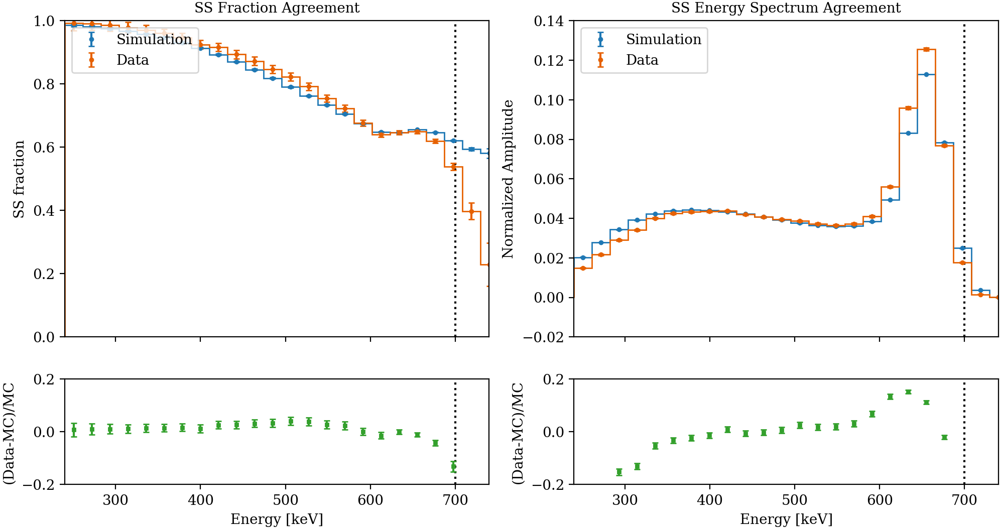

In [223]:
run_ssfrac(s="S2", th=240, source="Cs-137", roi = 900, xmax = 700)

### Source Position 5 ###

{'S5': {'MeanSSerr': [(0.09107030049794025, 0.0022103221993216814)],
  'MaxSSerr': [0.23781746570141055],
  'MeanSSerr ROI': [(nan, nan)],
  'MaxSSerr ROI': [nan]}}

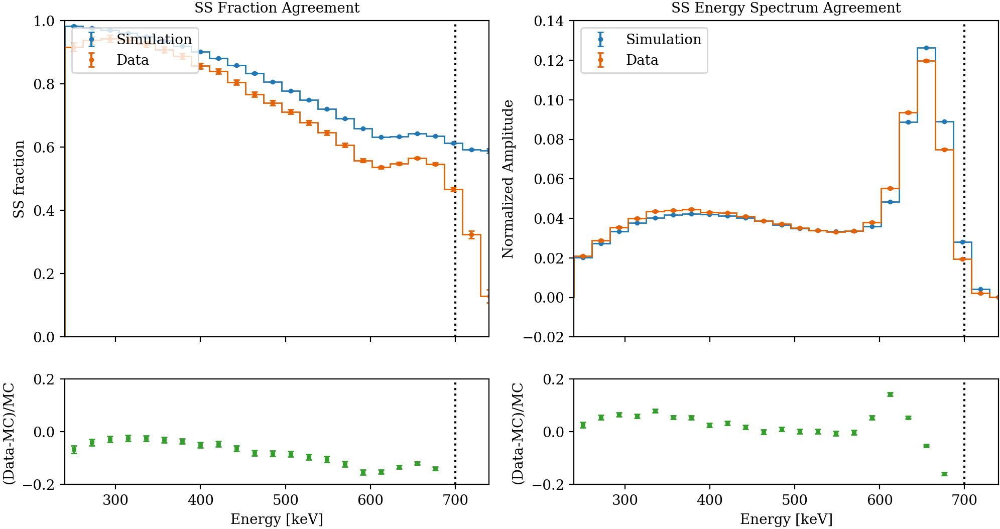

In [224]:
run_ssfrac(s="S5", th=240, source="Cs-137", roi = 900, xmax = 700)

## 300 keV ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.023246123793962355, 0.0033134444600810566)],
  'MaxSSerr': [0.09100707479928145],
  'MeanSSerr ROI': [(nan, nan)],
  'MaxSSerr ROI': [nan]}}

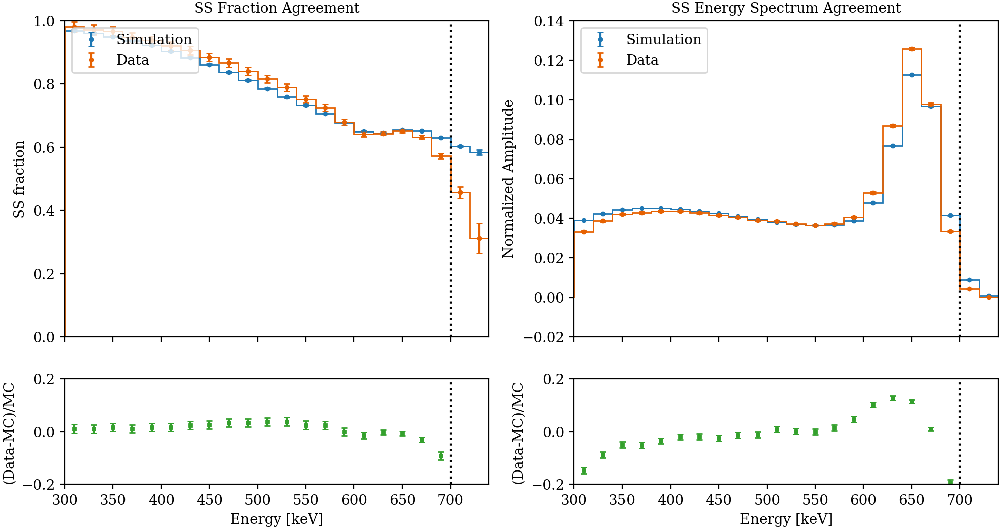

In [226]:
run_ssfrac(s="S2", th=300, source="Cs-137", roi = 900, xmax = 700)

### Source Position: 5 ###

{'S5': {'MeanSSerr': [(0.08300247623557605, 0.0021276938702846763)],
  'MaxSSerr': [0.17723253250915158],
  'MeanSSerr ROI': [(nan, nan)],
  'MaxSSerr ROI': [inf]}}

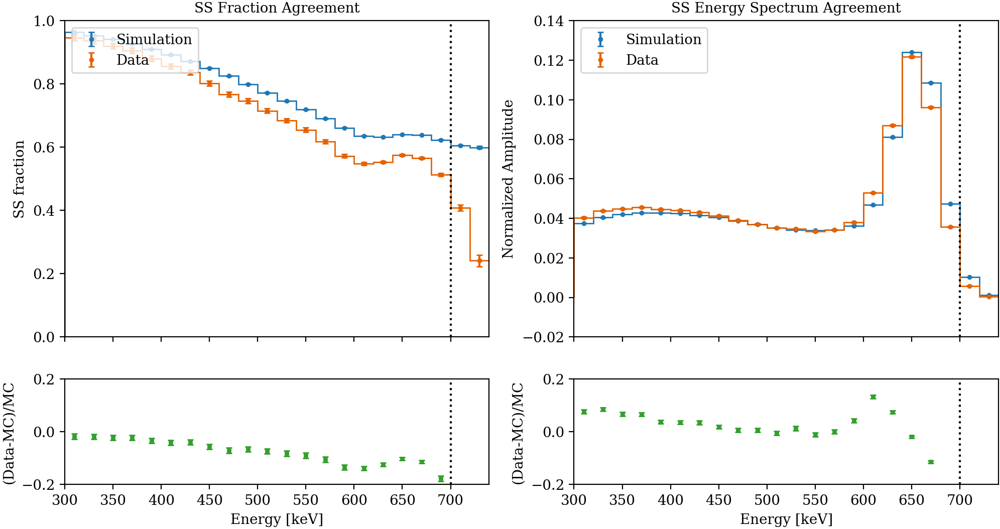

In [227]:
run_ssfrac(s="S5", th=300, source="Cs-137", roi = 900, xmax = 700)

In [107]:
Cs_rates = []
Cs_rates_err = []
for s in ["S2","S5"]:
    roo = uproot.open("/nfs/slac/g/exo_data8/exo_data/users/hpeltzsmalley/Xe134/shape/2019_Phase2_0nu_Ind_weekly/"+str(th)+"/"
    +"SourceAgreement_2024_0vbb_Xe134_Nondenoised_3d_"+source+"_"+s+".root")
    ratioroo = roo['energy_ss_ss_shape_ratio_no_low;1']
    ratiohist = ratioroo.to_numpy()
    ratioerr = ratioroo.errors()[ratiohist[1][:-1] < 750]
    ratio = ratiohist[0][ratiohist[1][:-1] < 750]
    avg_ratio = np.average(ratio,weights=1/ratioerr)
    avg_ratio_err = np.sqrt(sum([i**2 for i in ratioerr]))/len(ratioerr)
    Cs_rates.append(avg_ratio-1)
    Cs_rates_err.append(avg_ratio_err)

In [82]:
Cs_rates

[-0.033166761504263564, -0.017205309720651818]

## 320 ##

### Source Position: 2 ###

{'S2': {'MeanSSerr': [(0.023777356849519475, 0.00338030208060662)],
  'MaxSSerr': [0.09099334836344475],
  'MeanSSerr ROI': [(nan, nan)],
  'MaxSSerr ROI': [nan]}}

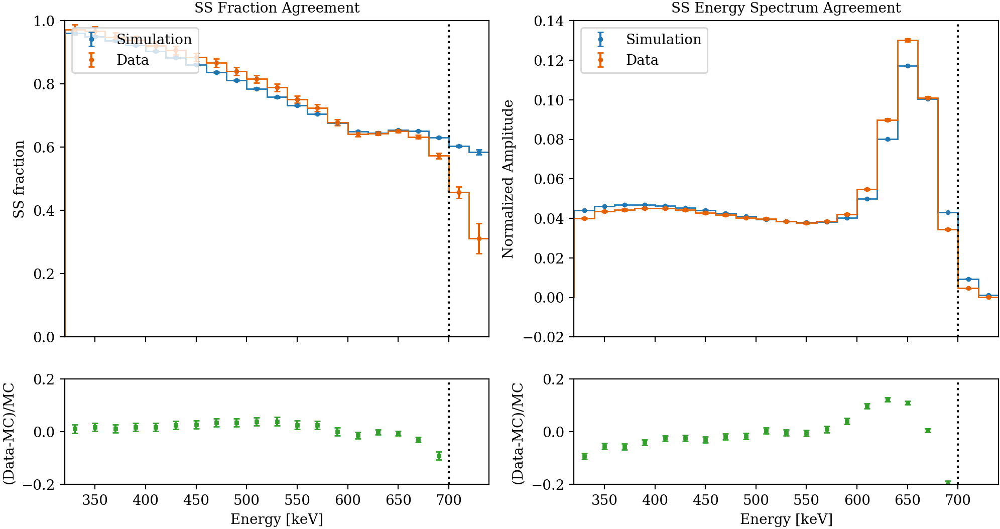

In [23]:
run_ssfrac(s="S2", th=320, source="Cs-137", roi = 900, xmax = 700)

### Source Position: 5 ###

{'S5': {'MeanSSerr': [(0.08621660222502012, 0.002178424102503252)],
  'MaxSSerr': [0.1772182996465109],
  'MeanSSerr ROI': [(nan, nan)],
  'MaxSSerr ROI': [inf]}}

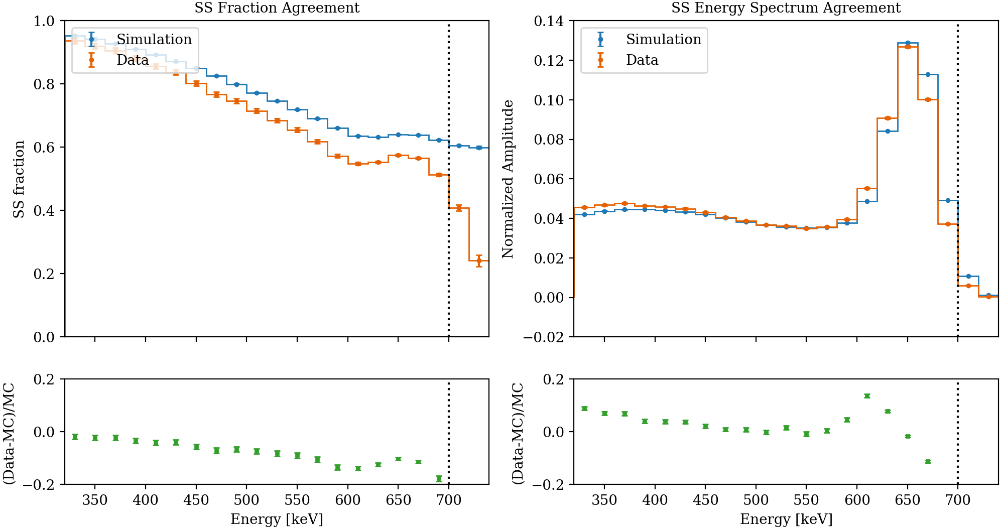

In [24]:
run_ssfrac(s="S5", th=320, source="Cs-137", roi = 900, xmax = 700)

In [108]:
Cs_rates_320 = []
Cs_rates_320_err = []
for s in ["S2","S5"]:
    roo = uproot.open("/nfs/slac/g/exo_data8/exo_data/users/hpeltzsmalley/Xe134/shape/2019_Phase2_0nu_Ind_weekly/320/"
    +"SourceAgreement_2024_0vbb_Xe134_Nondenoised_3d_"+source+"_"+s+".root")
    ratioroo = roo['energy_ss_ss_shape_ratio_no_low;1']
    ratiohist = ratioroo.to_numpy()
    ratioerr = ratioroo.errors()[ratiohist[1][:-1] < 750]
    ratio = ratiohist[0][ratiohist[1][:-1] < 750]
    avg_ratio = np.average(ratio,weights=1/ratioerr)
    avg_ratio_err = np.sqrt(sum([i**2 for i in ratioerr]))/len(ratioerr)
    Cs_rates_320.append(avg_ratio-1)
    Cs_rates_320_err.append(avg_ratio_err)

## 340 keV ##

### Source Position: 2 ###

{'S2': {'MeanSSerr': [(0.024093767710732045, 0.0034616021755783165)],
  'MaxSSerr': [0.09097982284184312],
  'MeanSSerr ROI': [(nan, nan)],
  'MaxSSerr ROI': [nan]}}

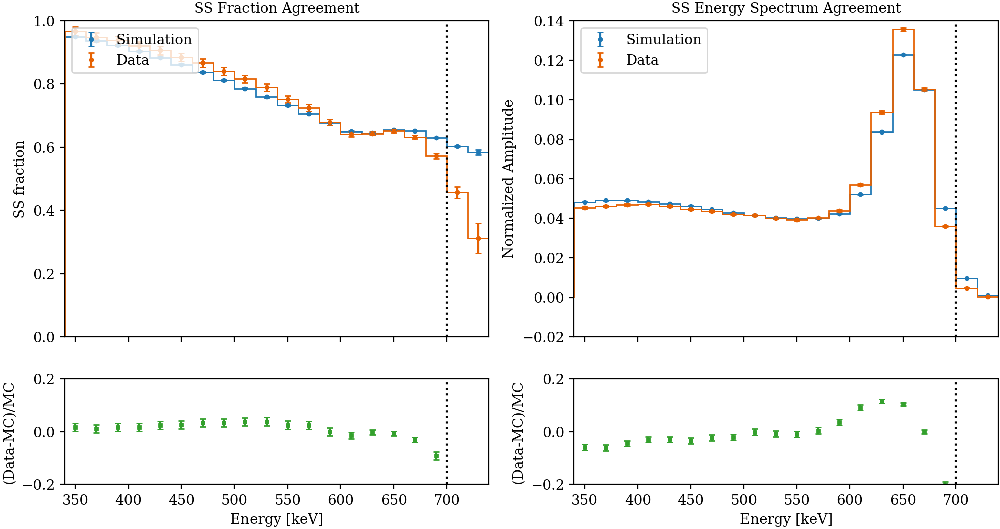

In [23]:
run_ssfrac(s="S2", th=340, source="Cs-137", roi = 900, xmax = 700)

### Source Position: 5 ###

{'S5': {'MeanSSerr': [(0.08959011645420596, 0.002235187869888345)],
  'MaxSSerr': [0.1772019653874568],
  'MeanSSerr ROI': [(nan, nan)],
  'MaxSSerr ROI': [inf]}}

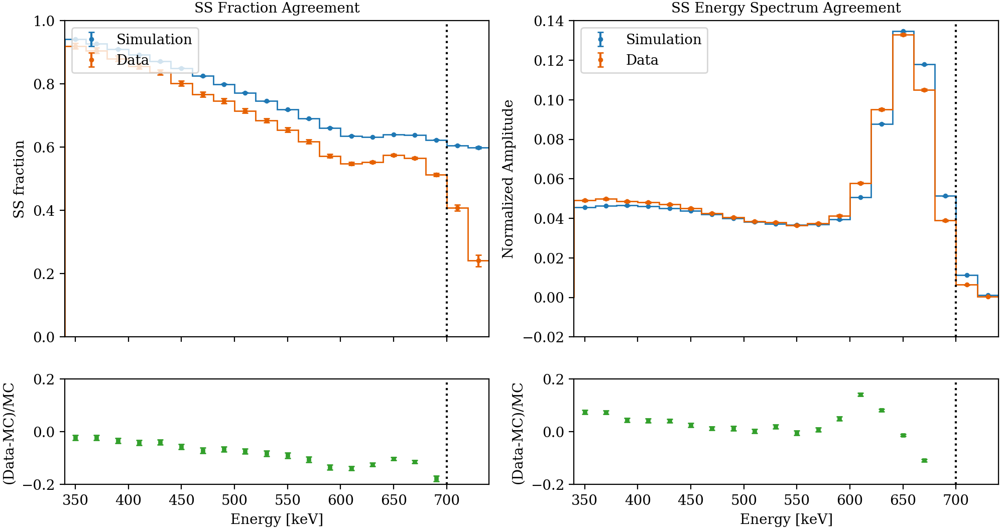

In [24]:
run_ssfrac(s="S5", th=340, source="Cs-137", roi = 900, xmax = 700)

## 360 keV ##

### Source Position: 2 ###

{'S2': {'MeanSSerr': [(0.024785179100793423, 0.0035519456360165865)],
  'MaxSSerr': [0.09096810675375565],
  'MeanSSerr ROI': [(nan, nan)],
  'MaxSSerr ROI': [nan]}}

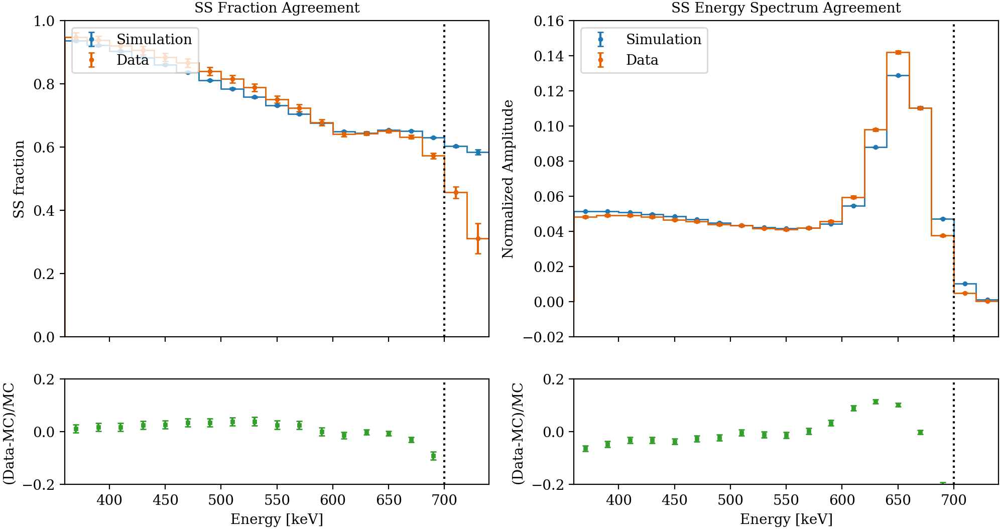

In [25]:
run_ssfrac(s="S2", th=360, source="Cs-137", roi = 900, xmax = 700)

### Source Position: 5 ###

{'S5': {'MeanSSerr': [(0.09337960412644443, 0.002298388287477807)],
  'MaxSSerr': [0.1771899641869386],
  'MeanSSerr ROI': [(nan, nan)],
  'MaxSSerr ROI': [inf]}}

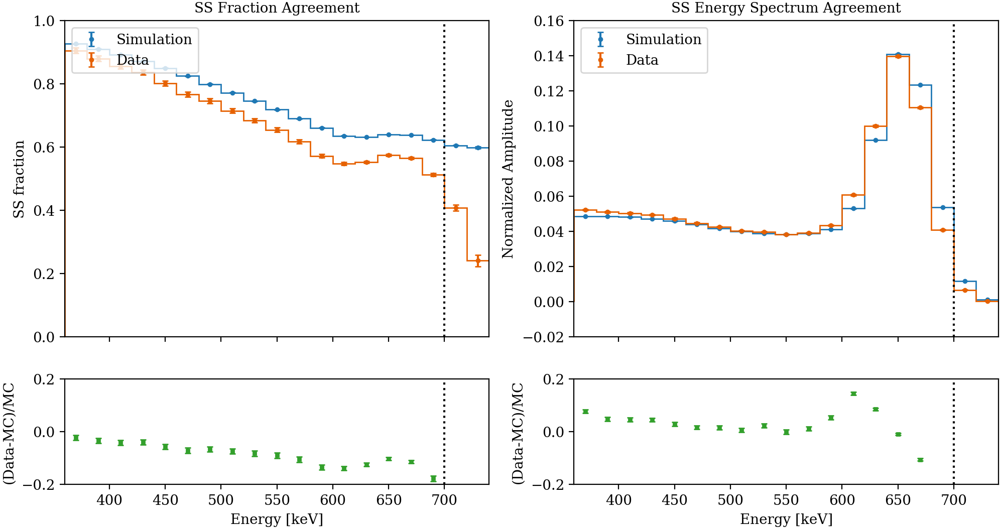

In [27]:
run_ssfrac(s="S5", th=360, source="Cs-137", roi = 900, xmax = 700)

## 380 keV ##

### Source Position: 2 ###

{'S2': {'MeanSSerr': [(0.025232969697330777, 0.003652474996977718)],
  'MaxSSerr': [0.09092749888947721],
  'MeanSSerr ROI': [(nan, nan)],
  'MaxSSerr ROI': [nan]}}

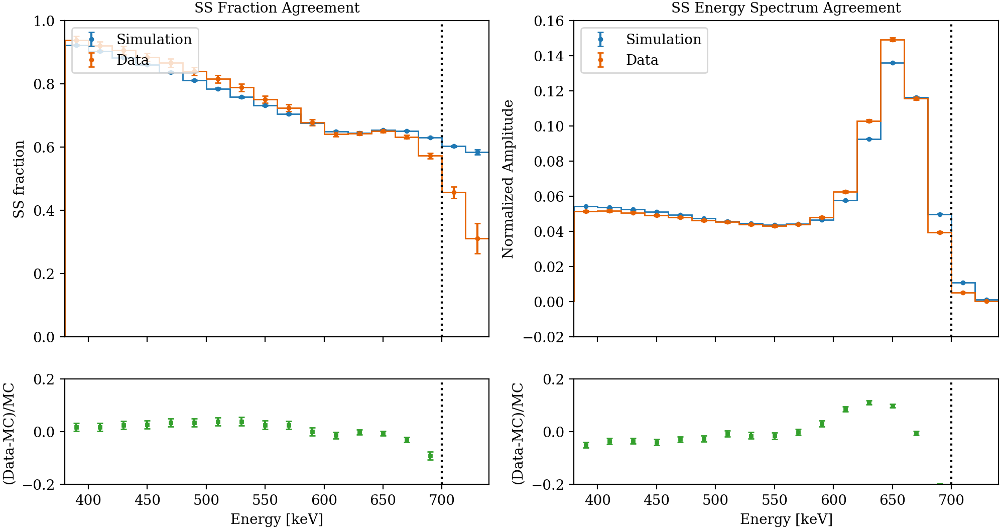

In [7]:
run_ssfrac(s="S2", th=380, source="Cs-137", roi = 900, xmax = 700)

### Source Position: 5 ###

{'S5': {'MeanSSerr': [(0.09696764516193221, 0.0023662328029171132)],
  'MaxSSerr': [0.17717076013840466],
  'MeanSSerr ROI': [(nan, nan)],
  'MaxSSerr ROI': [inf]}}

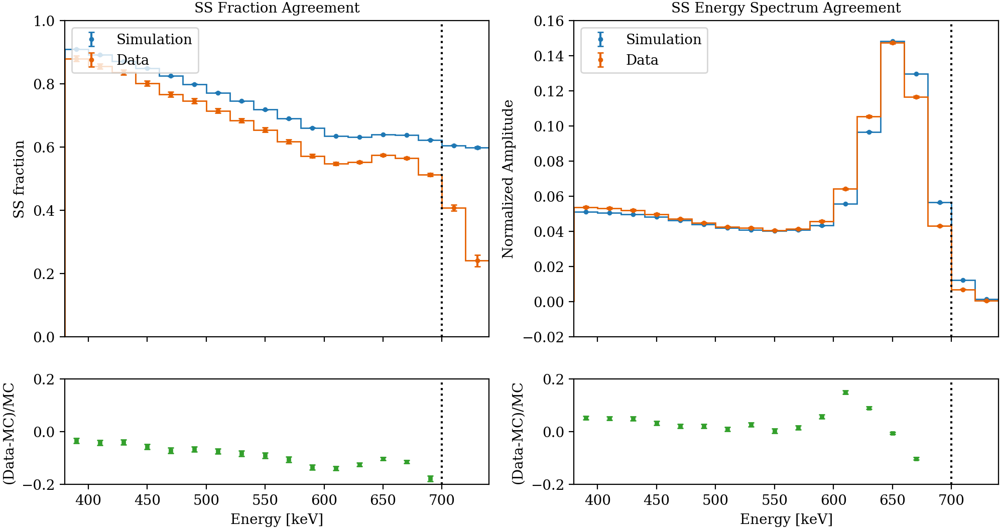

In [8]:
run_ssfrac(s="S5", th=380, source="Cs-137", roi = 900, xmax = 700)

## 400 keV ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.025654247307552305, 0.0037635393375060927)],
  'MaxSSerr': [0.09096463831383839],
  'MeanSSerr ROI': [(nan, nan)],
  'MaxSSerr ROI': [nan]}}

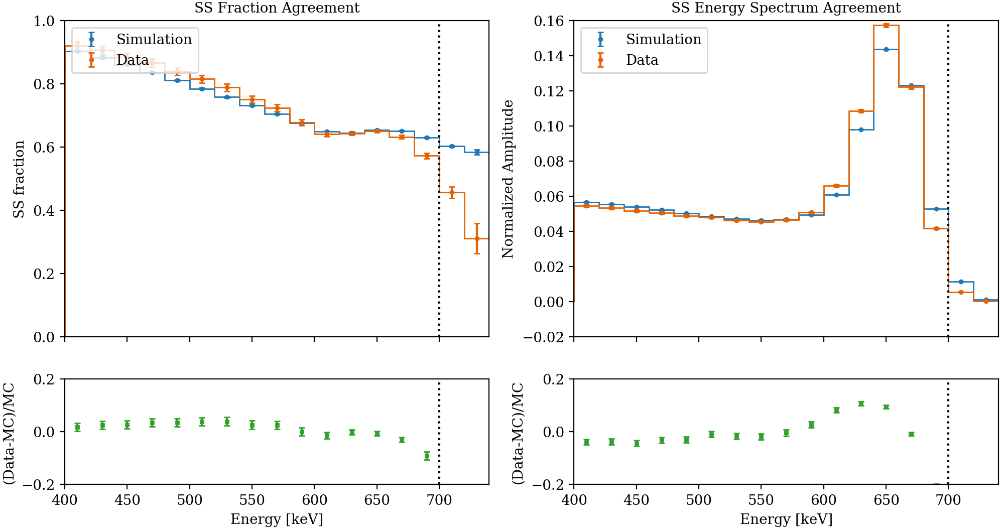

In [9]:
run_ssfrac(s="S2", th=400, source="Cs-137", roi = 900, xmax = 700)

### Source Position: 5 ###

{'S5': {'MeanSSerr': [(0.09696764516193221, 0.0023662328029171132)],
  'MaxSSerr': [0.17717076013840466],
  'MeanSSerr ROI': [(nan, nan)],
  'MaxSSerr ROI': [inf]}}

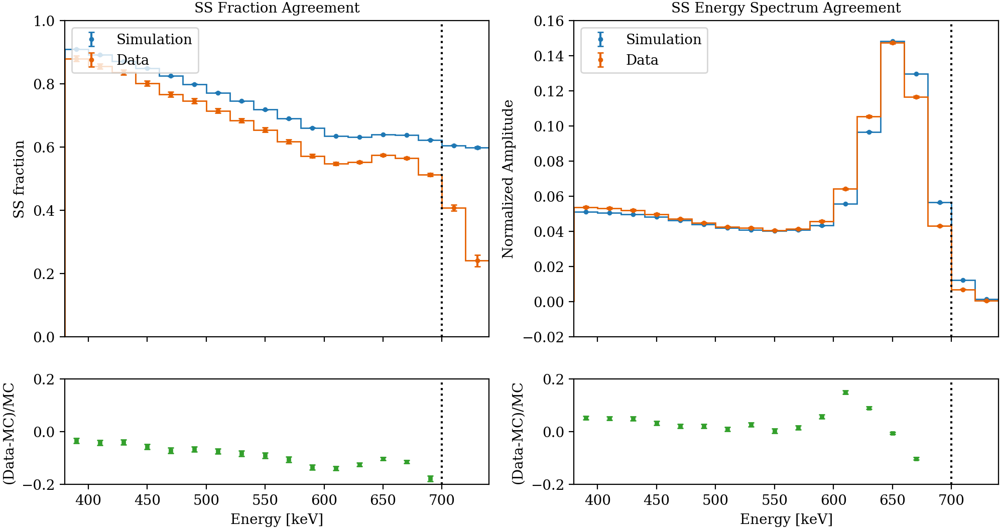

In [10]:
run_ssfrac(s="S5", th=380, source="Cs-137", roi = 900, xmax = 700)

# Co-60 #

## 240 keV ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.05839916134294587, 0.00307188502955062)],
  'MaxSSerr': [0.3504543230968554],
  'MeanSSerr ROI': [(0.029527861055461124, 0.003257369596808872)],
  'MaxSSerr ROI': [0.08421069040661916]}}

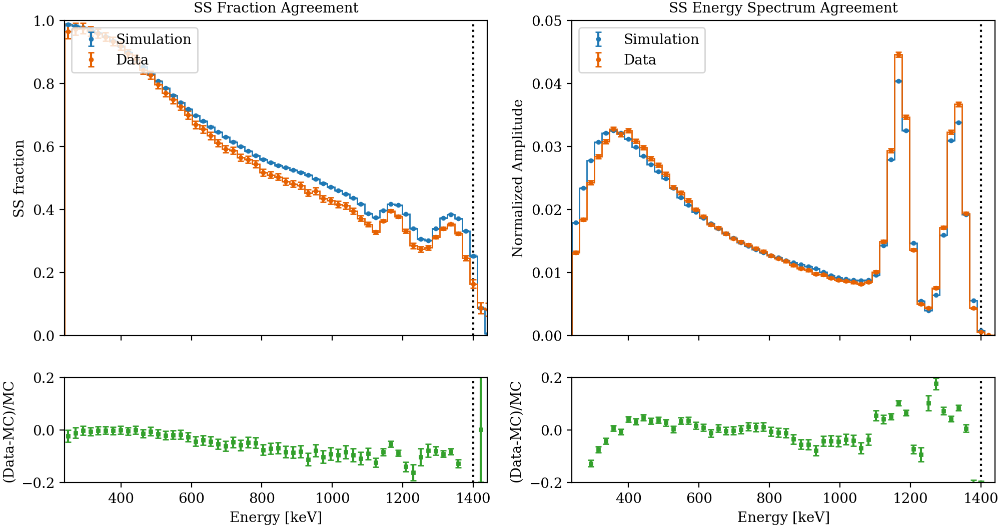

In [28]:
run_ssfrac(s="S2", th=240, source="Co-60", roi = 900, xmax = 1400)

### Source Position 5 ###

{'S5': {'MeanSSerr': [(0.023895298961052, 0.00386206401027627)],
  'MaxSSerr': [0.1486819627969794],
  'MeanSSerr ROI': [(0.026584208837005133, 0.004307451706316924)],
  'MaxSSerr ROI': [0.05005477370291617]}}

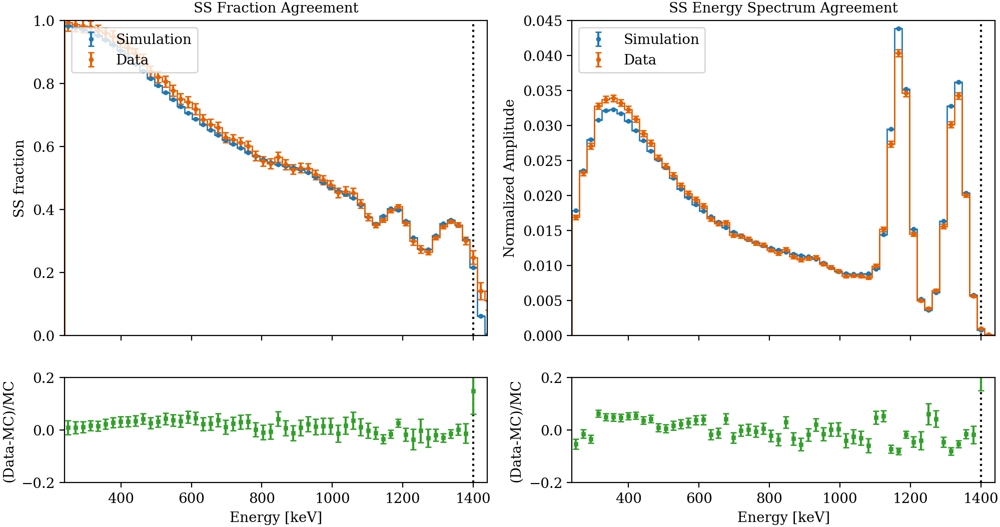

In [29]:
run_ssfrac(s="S5", th=240, source="Co-60", roi = 900, xmax = 1400)

### Source Position 8 ###

{'S8': {'MeanSSerr': [(0.08071346617444938, 0.004147704972957876)],
  'MaxSSerr': [0.24591460418155123],
  'MeanSSerr ROI': [(0.05237036140121262, 0.00435730860268607)],
  'MaxSSerr ROI': [0.1310426730556576]}}

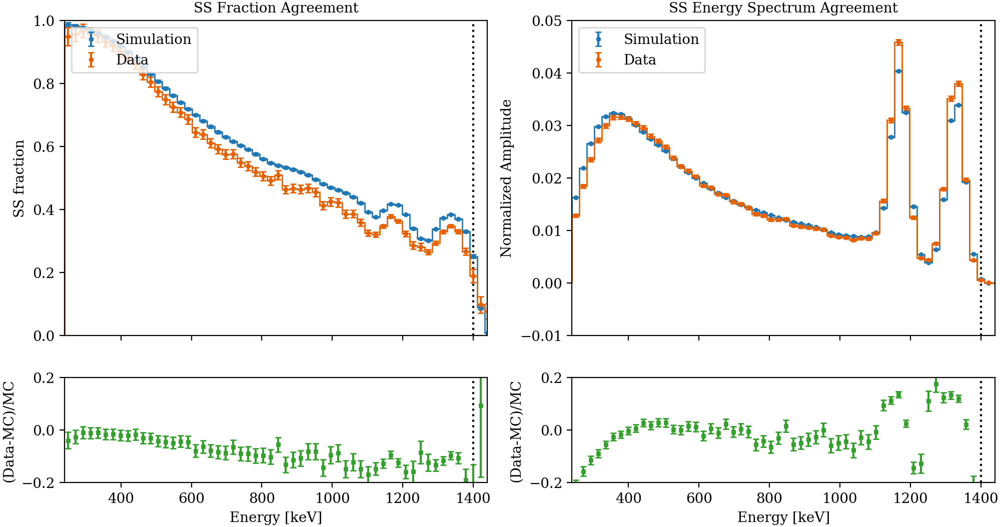

In [30]:
run_ssfrac(s="S8", th=240, source="Co-60", roi = 900, xmax = 1400)

## 300 keV ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.060979651277541666, 0.0029119779389928492)],
  'MaxSSerr': [0.3232363613360623],
  'MeanSSerr ROI': [(0.030552921754007624, 0.0034489130813562946)],
  'MaxSSerr ROI': [0.09262807977803086]}}

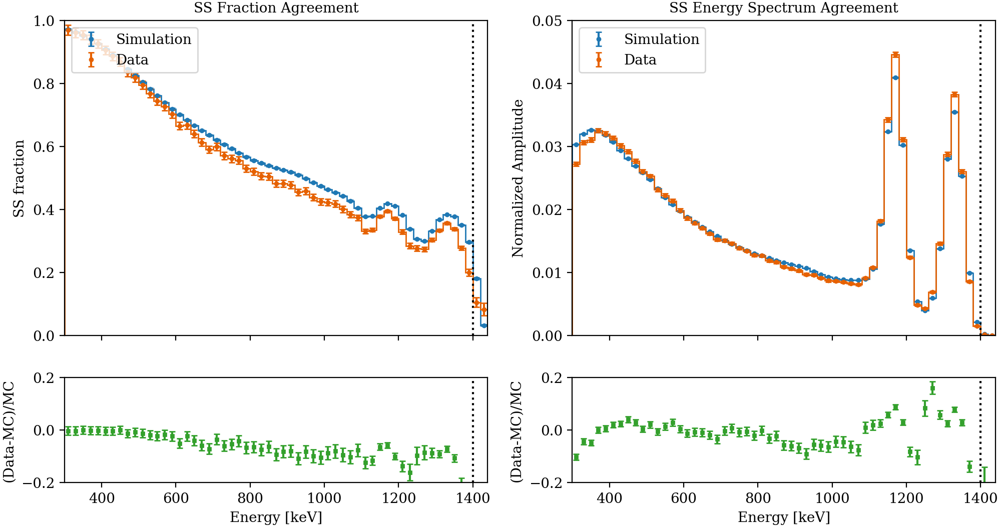

In [8]:
run_ssfrac(s="S2", th=300, source="Co-60", roi = 900, xmax = 1400)

### Source Position 5 ###

{'S5': {'MeanSSerr': [(0.026814343178964698, 0.0018506652401079264)],
  'MaxSSerr': [0.07900294394119946],
  'MeanSSerr ROI': [(0.013088115524406339, 0.002245225760622869)],
  'MaxSSerr ROI': [0.04108251991078463]}}

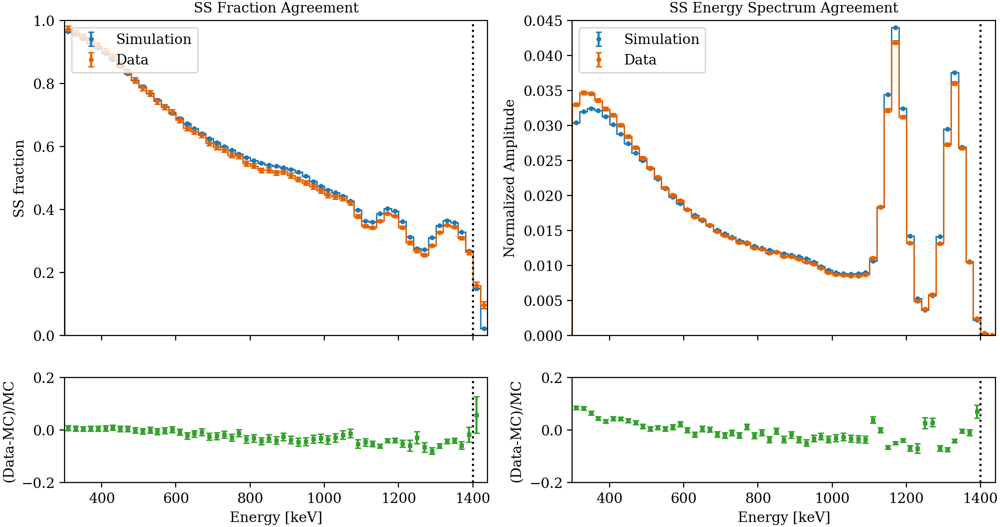

In [9]:
run_ssfrac(s="S5", th=300, source="Co-60", roi = 900, xmax = 1400)

### Source Position 8 ###

{'S8': {'MeanSSerr': [(0.08402002700249747, 0.003898990981705183)],
  'MaxSSerr': [0.2544404062095411],
  'MeanSSerr ROI': [(0.05454094365558786, 0.00461408614866022)],
  'MaxSSerr ROI': [0.1367646090154279]}}

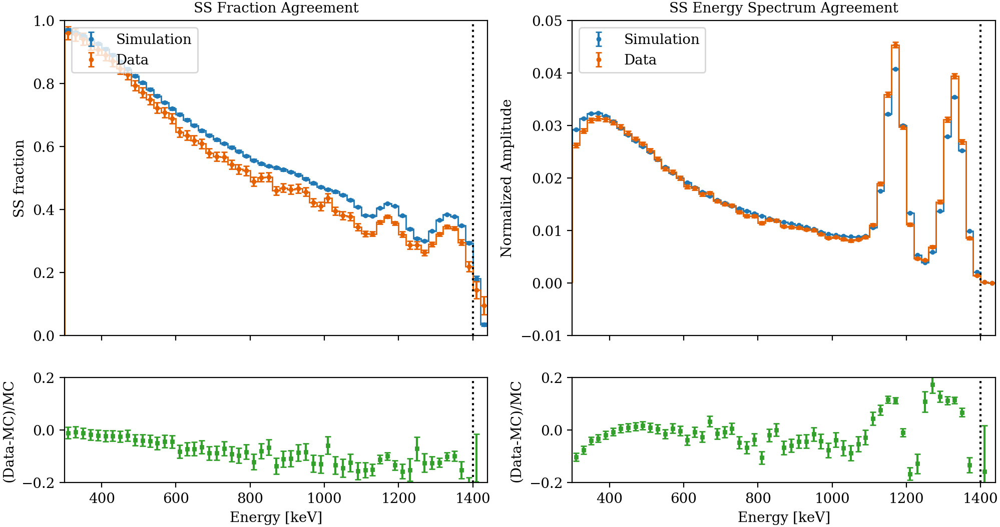

In [10]:
run_ssfrac(s="S8", th=300, source="Co-60", roi = 900, xmax = 1400)

In [152]:
Co_rates = []
Co_rates_err = []
for s in ["S2","S5","S8"]:
    roo = uproot.open("/nfs/slac/g/exo_data8/exo_data/users/hpeltzsmalley/Xe134/shape/2019_Phase2_0nu_Ind_weekly/300/"
    +"SourceAgreement_2024_0vbb_Xe134_Nondenoised_3d_Co-60_"+s+".root")
    ratioroo = roo['energy_ss_ss_shape_ratio_no_low;1']
    ratiohist = ratioroo.to_numpy()
    ratioerr = ratioroo.errors()[ratiohist[1][:-1] < 1400]
    ratio = ratiohist[0][ratiohist[1][:-1] < 1400]
    avg_ratio = np.average(ratio,weights=1/ratioerr)
    avg_ratio_err = np.sqrt(sum([i**2 for i in ratioerr]))/len(ratioerr)
    Co_rates.append(avg_ratio-1)
    Co_rates_err.append(avg_ratio_err)
print(Co_rates)

[-0.008146756558226387, -0.003611247544837215, -0.009691388567571124]


## 320 keV ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.06233333998191633, 0.002952431948805341)],
  'MaxSSerr': [0.32328758332241603],
  'MeanSSerr ROI': [(0.031743796140872305, 0.0035288259230989148)],
  'MaxSSerr ROI': [0.09262823638936722]}}

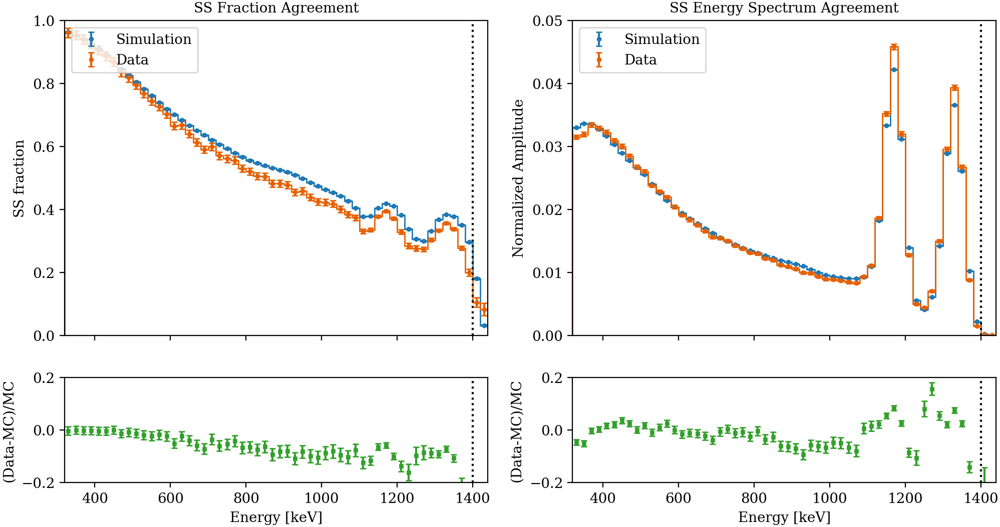

In [7]:
run_ssfrac(s="S2", th=320, source="Co-60", roi = 900, xmax = 1400)

### Source Position: 5 ###

{'S5': {'MeanSSerr': [(0.02731473780950087, 0.0018771905442410532)],
  'MaxSSerr': [0.079003241464482],
  'MeanSSerr ROI': [(0.013387239966389613, 0.0023009575180746866)],
  'MaxSSerr ROI': [0.04108251979826395]}}

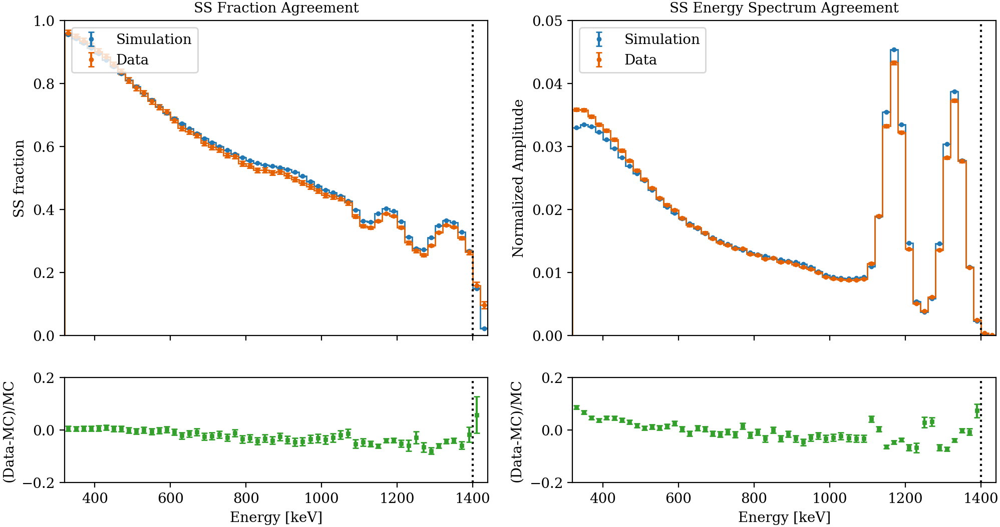

In [8]:
run_ssfrac(s="S5", th=320, source="Co-60", roi = 900, xmax = 1400)

### Source Position 8 ###

{'S8': {'MeanSSerr': [(0.08573255918315334, 0.003952142038069364)],
  'MaxSSerr': [0.2545175046432036],
  'MeanSSerr ROI': [(0.0564662216489757, 0.004717867915167167)],
  'MaxSSerr ROI': [0.13676490438344313]}}

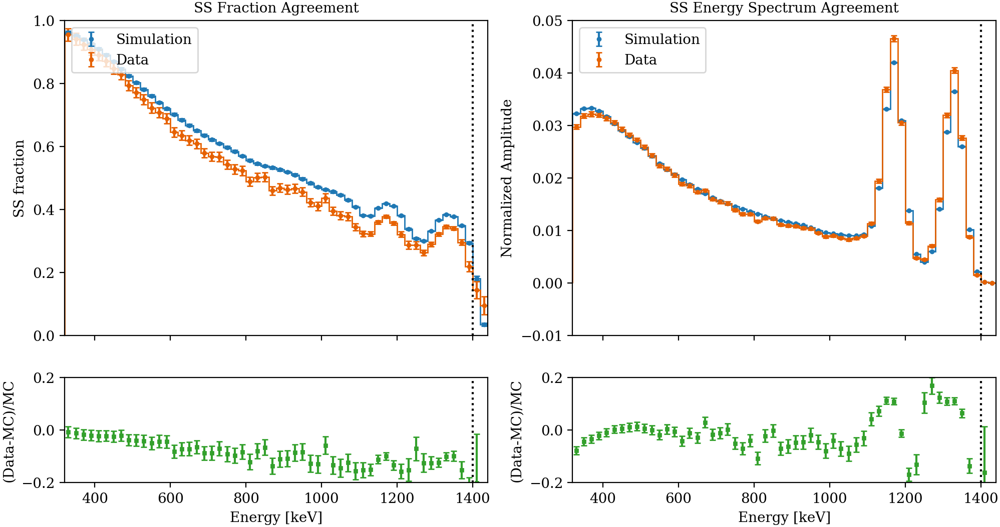

In [10]:
run_ssfrac(s="S8", th=320, source="Co-60", roi = 900, xmax = 1400)

In [153]:
Co_rates_320 = []
Co_rates_320_err = []
for s in ["S2","S5","S8"]:
    roo = uproot.open("/nfs/slac/g/exo_data8/exo_data/users/hpeltzsmalley/Xe134/shape/2019_Phase2_0nu_Ind_weekly/320/"
    +"SourceAgreement_2024_0vbb_Xe134_Nondenoised_3d_Co-60_"+s+".root")
    ratioroo = roo['energy_ss_ss_shape_ratio_no_low;1']
    ratiohist = ratioroo.to_numpy()
    ratioerr = ratioroo.errors()[ratiohist[1][:-1] < 1900]
    ratio = ratiohist[0][ratiohist[1][:-1] < 1900]
    avg_ratio = np.average(ratio,weights=1/ratioerr)
    avg_ratio_err = np.sqrt(sum([i**2 for i in ratioerr]))/len(ratioerr)
    Co_rates_320.append(avg_ratio-1)
    Co_rates_320_err.append(avg_ratio_err)
print(Co_rates)

[-0.008146756558226387, -0.003611247544837215, -0.009691388567571124]


/tmp/ipykernel_29729/567650425.py:10: RuntimeWarning: divide by zero encountered in divide
  avg_ratio = np.average(ratio,weights=1/ratioerr)


## 340 keV ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.06379977870408976, 0.0029946360571100686)],
  'MaxSSerr': [0.3233108667659674],
  'MeanSSerr ROI': [(0.033118819452111654, 0.0036149165428700863)],
  'MaxSSerr ROI': [0.09262839234413277]}}

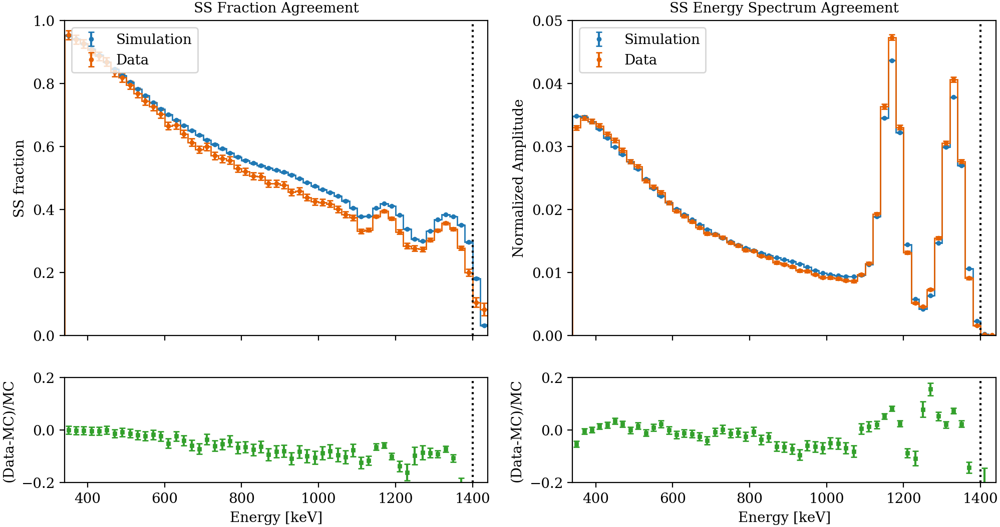

In [12]:
run_ssfrac(s="S2", th=340, source="Co-60", roi = 900, xmax = 1400)

### Source Position 5 ###

{'S5': {'MeanSSerr': [(0.0278641416671256, 0.0019047314703053862)],
  'MaxSSerr': [0.0790004822894441],
  'MeanSSerr ROI': [(0.013758355211197856, 0.0023606446469082998)],
  'MaxSSerr ROI': [0.04108251627412132]}}

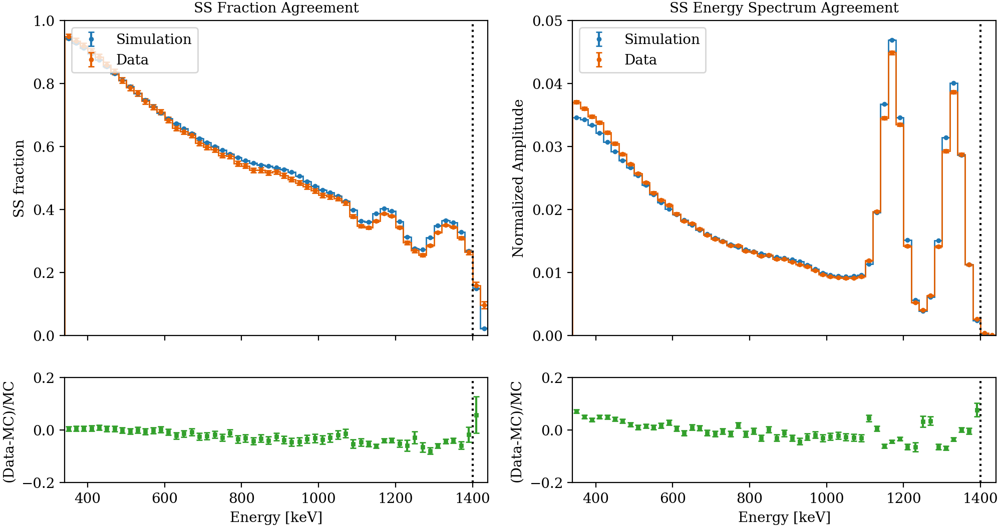

In [13]:
run_ssfrac(s="S5", th=340, source="Co-60", roi = 900, xmax = 1400)

### Source Position 8 ###

{'S8': {'MeanSSerr': [(0.08749116841973319, 0.004008707900778359)],
  'MaxSSerr': [0.2546328901661276],
  'MeanSSerr ROI': [(0.05844765544368264, 0.0048330641236469535)],
  'MaxSSerr ROI': [0.13676528805333202]}}

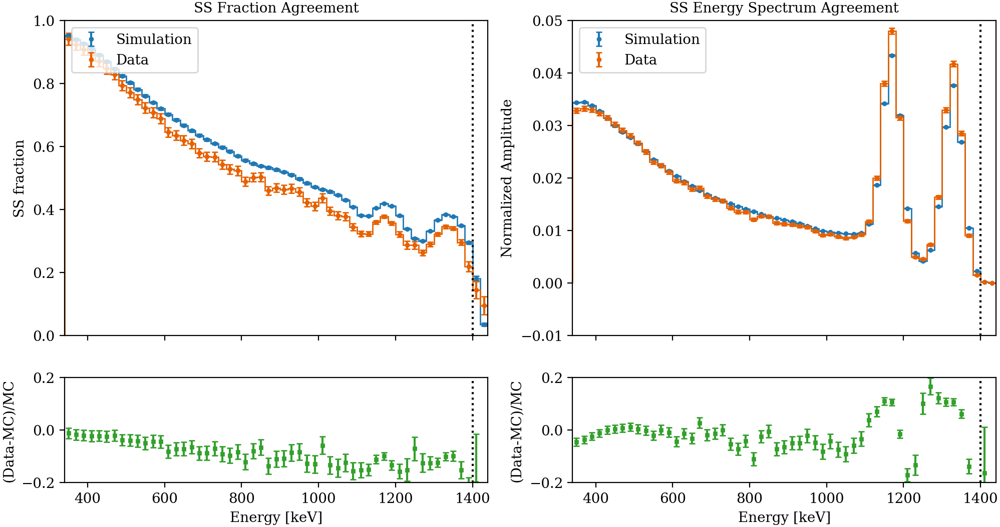

In [14]:
run_ssfrac(s="S8", th=340, source="Co-60", roi = 900, xmax = 1400)

## 360 keV ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.06535855421124656, 0.00303917730243384)],
  'MaxSSerr': [0.323373503769246],
  'MeanSSerr ROI': [(0.034621499579627936, 0.0037094354458810626)],
  'MaxSSerr ROI': [0.09262864179684305]}}

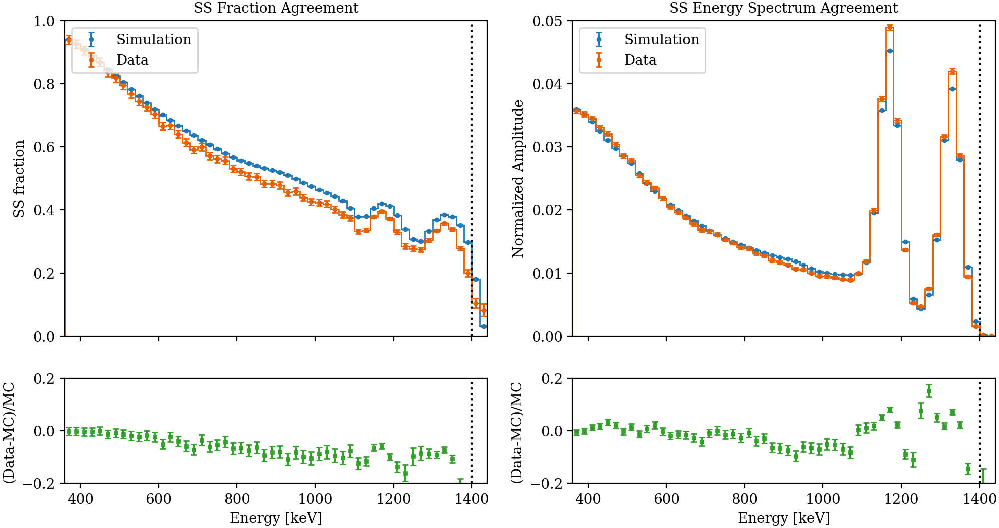

In [15]:
run_ssfrac(s="S2", th=360, source="Co-60", roi = 900, xmax = 1400)

### Source Position 5 ###

{'S5': {'MeanSSerr': [(0.028423284408265068, 0.0019331225694676313)],
  'MaxSSerr': [0.07900783717584683],
  'MeanSSerr ROI': [(0.014135382468883196, 0.0024240508893649954)],
  'MaxSSerr ROI': [0.04108252333925352]}}

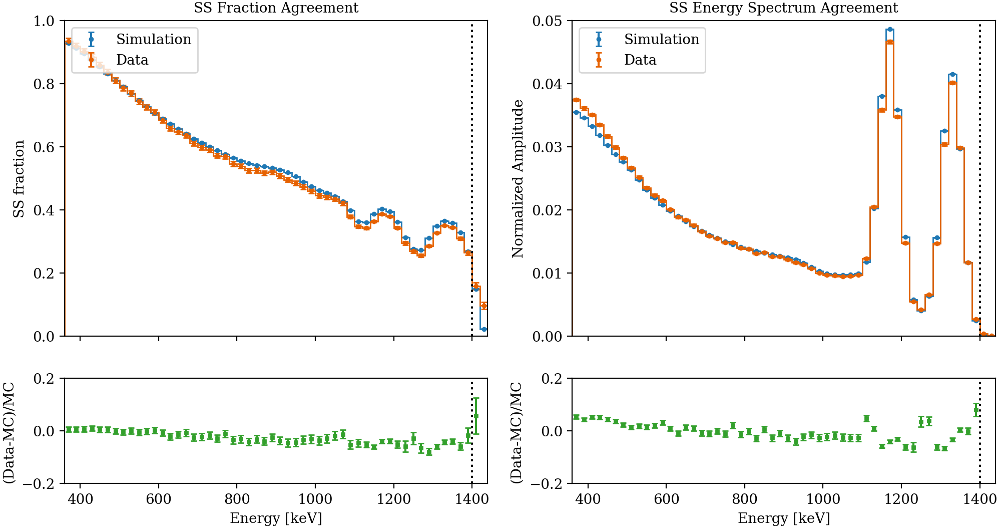

In [16]:
run_ssfrac(s="S5", th=360, source="Co-60", roi = 900, xmax = 1400)

### Source Position 8 ###

{'S8': {'MeanSSerr': [(0.08921852697627895, 0.004067775154207202)],
  'MaxSSerr': [0.25467574303669843],
  'MeanSSerr ROI': [(0.06038049606068231, 0.004957544278148552)],
  'MaxSSerr ROI': [0.13676562039342272]}}

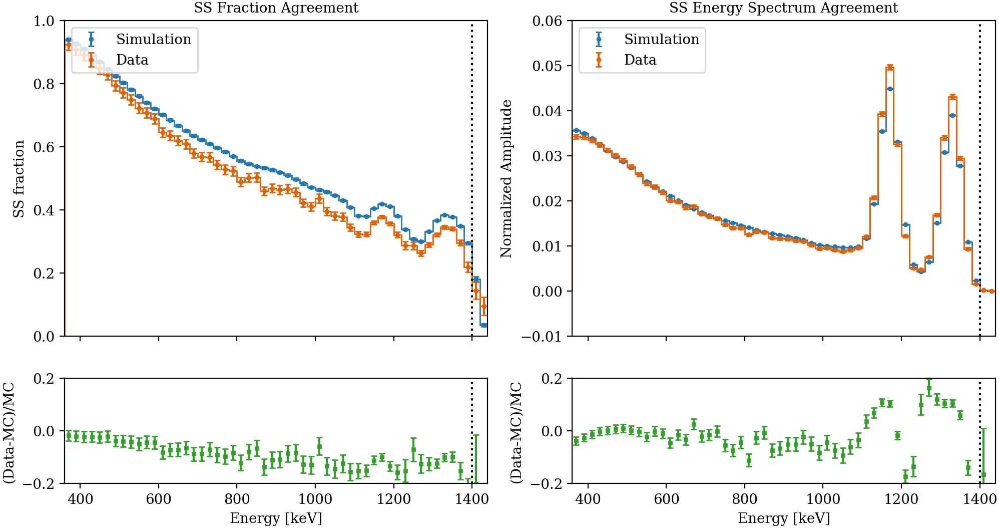

In [17]:
run_ssfrac(s="S8", th=360, source="Co-60", roi = 900, xmax = 1400)

## 380 keV ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.06700873731329819, 0.003085297025627239)],
  'MaxSSerr': [0.3234049485126658],
  'MeanSSerr ROI': [(0.03630467073634417, 0.003810513555742537)],
  'MaxSSerr ROI': [0.09262882595033567]}}

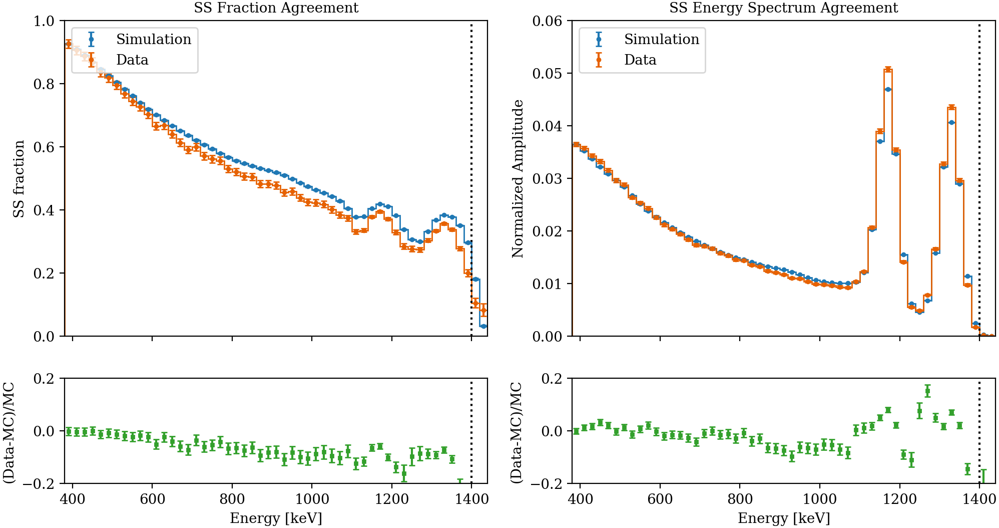

In [11]:
run_ssfrac(s="S2", th=380, source="Co-60", roi = 900, xmax = 1400)

### Source Position 5 ###

{'S5': {'MeanSSerr': [(0.0289776266538294, 0.001962338129363886)],
  'MaxSSerr': [0.07901065256908033],
  'MeanSSerr ROI': [(0.014496142686926186, 0.0024913561691872217)],
  'MaxSSerr ROI': [0.04108252396211753]}}

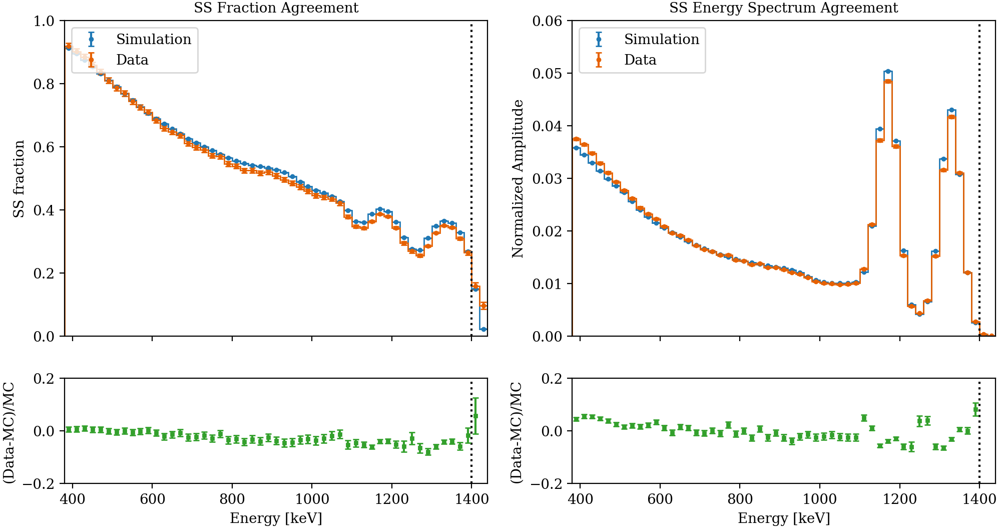

In [12]:
run_ssfrac(s="S5", th=380, source="Co-60", roi = 900, xmax = 1400)

### Source Position 8 ###

{'S8': {'MeanSSerr': [(0.09097447139133304, 0.004129163499767734)],
  'MaxSSerr': [0.2547264317805494],
  'MeanSSerr ROI': [(0.06238698428783329, 0.005091344687733531)],
  'MaxSSerr ROI': [0.13676600792748253]}}

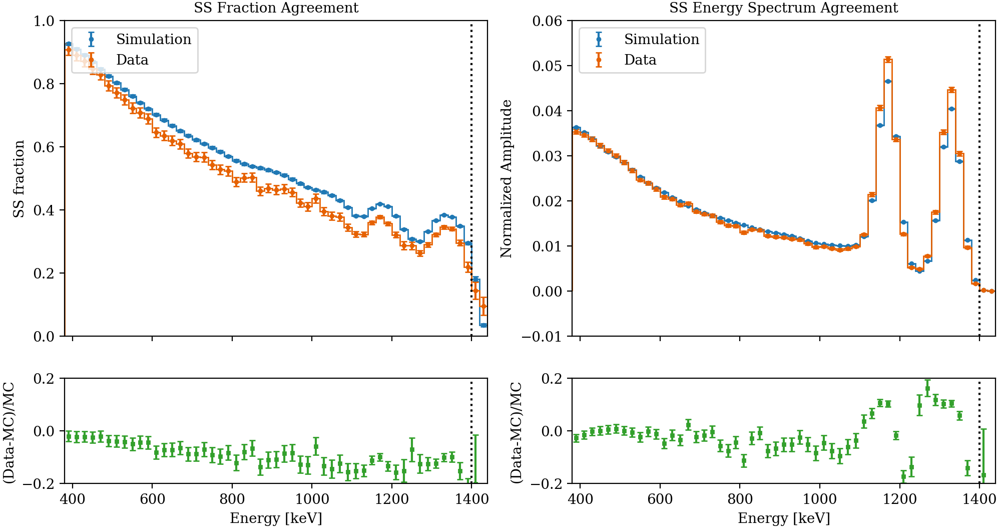

In [13]:
run_ssfrac(s="S8", th=380, source="Co-60", roi = 900, xmax = 1400)

## 400 keV ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.06957604208571364, 0.004274581893885906)],
  'MaxSSerr': [0.4156693036970782],
  'MeanSSerr ROI': [(0.0393461500642818, 0.0038750615401850824)],
  'MaxSSerr ROI': [0.0926291297497215]}}

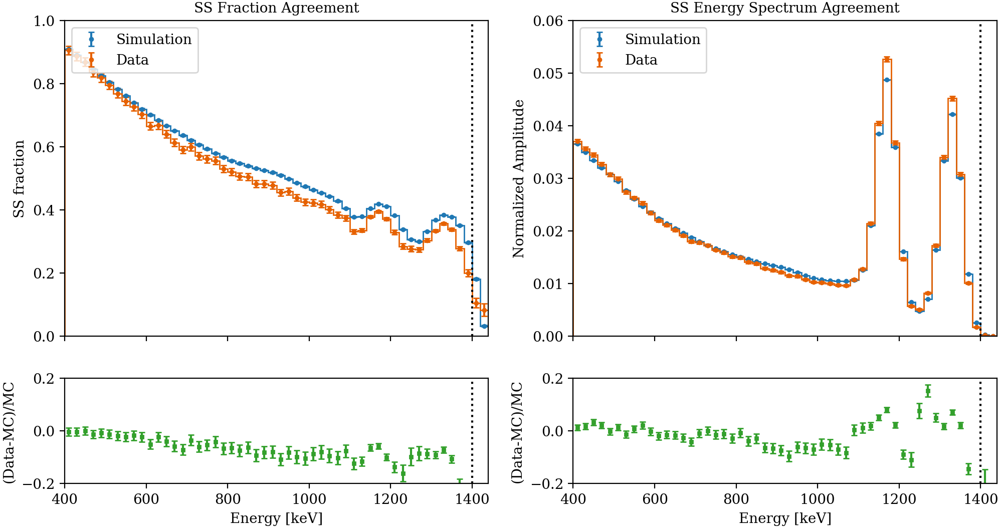

In [18]:
run_ssfrac(s="S2", th=400, source="Co-60", roi = 900, xmax = 1400)

### Source Position 5 ###

{'S5': {'MeanSSerr': [(0.02965056203884168, 0.002390183969643538)],
  'MaxSSerr': [0.07901405563561995],
  'MeanSSerr ROI': [(0.01560360577089924, 0.0025300578513634993)],
  'MaxSSerr ROI': [0.041082520701851234]}}

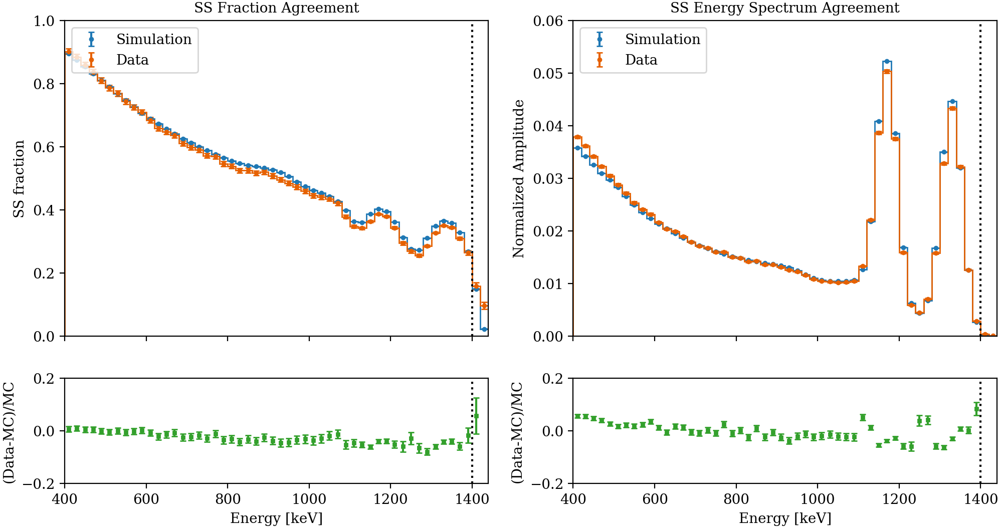

In [19]:
run_ssfrac(s="S5", th=400, source="Co-60", roi = 900, xmax = 1400)

### Source Position 8 ###

{'S8': {'MeanSSerr': [(0.09305434756079665, 0.005563796988232988)],
  'MaxSSerr': [0.2547328435362153],
  'MeanSSerr ROI': [(0.06587518889995897, 0.005172345452940533)],
  'MaxSSerr ROI': [0.13676636289551133]}}

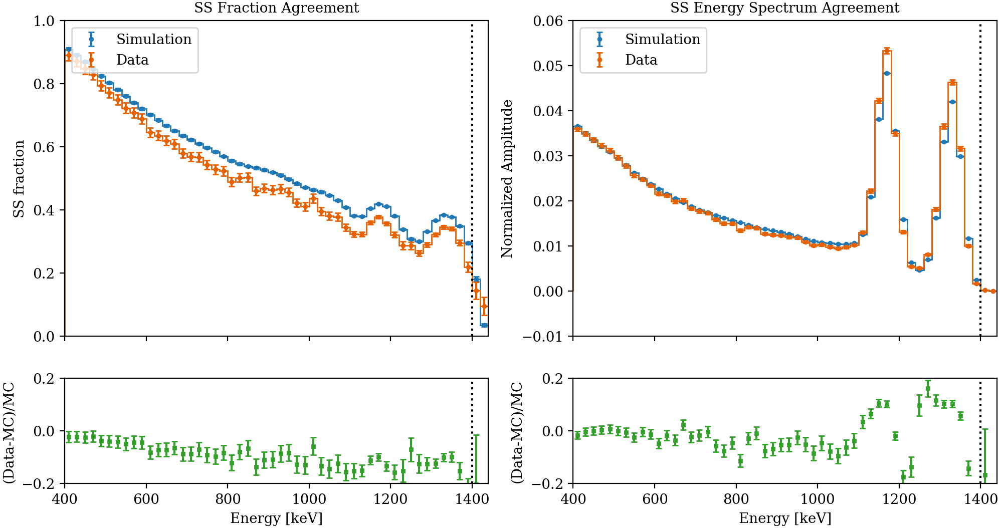

In [20]:
run_ssfrac(s="S8", th=400, source="Co-60", roi = 900, xmax = 1400)

# Th-228 #

## 240 keV ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.0213497040384037, 0.0033344051743141633)],
  'MaxSSerr': [0.0714439350563137],
  'MeanSSerr ROI': [(0.01632210923759416, 0.0027558130197354556)],
  'MaxSSerr ROI': [0.03193854183995856]}}

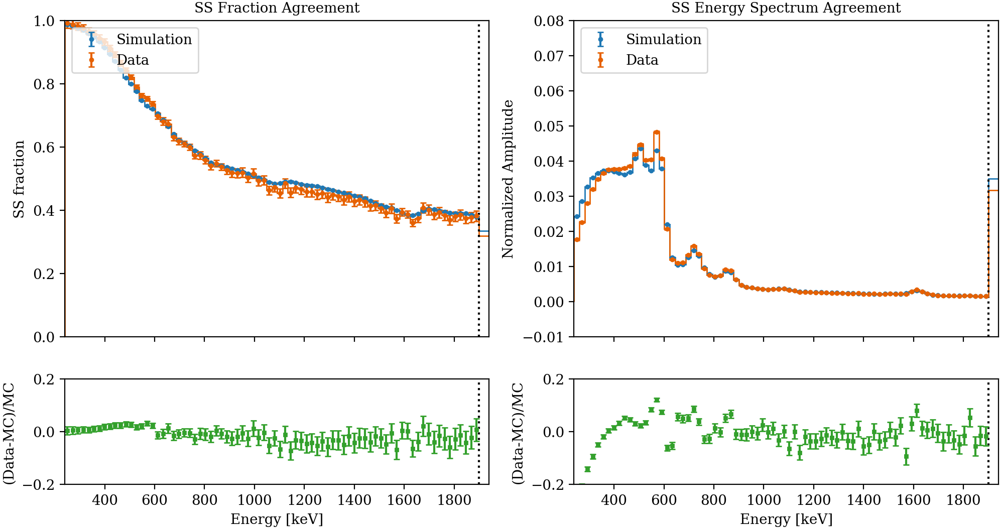

In [228]:
run_ssfrac(s="S2", th=240, source="Th-228", roi = 900, xmax = 1900)

### Source Position 5 ###

{'S5': {'MeanSSerr': [(0.02496786464390748, 0.002894791312649615)],
  'MaxSSerr': [0.08410208416207736],
  'MeanSSerr ROI': [(0.015089378121736314, 0.002217805924026342)],
  'MaxSSerr ROI': [0.05438493842036668]}}

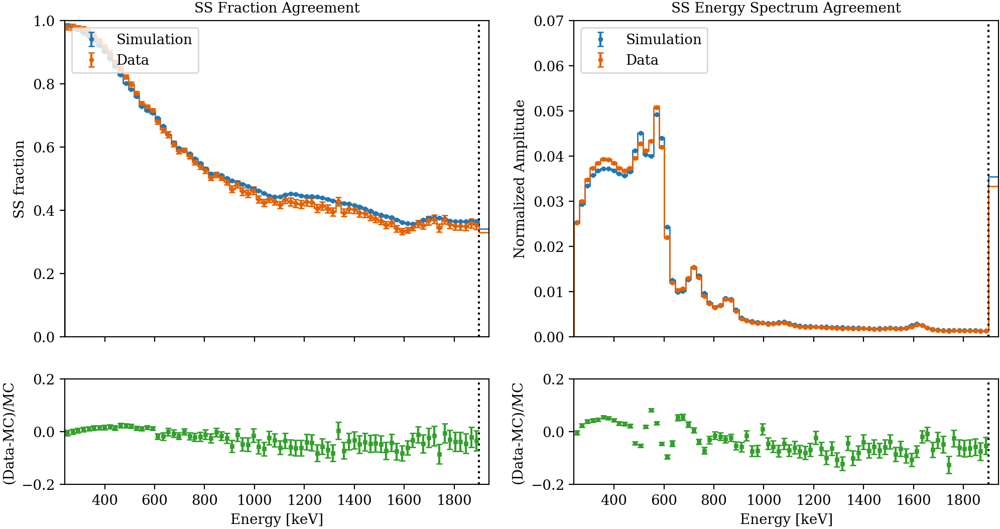

In [229]:
run_ssfrac(s="S5", th=240, source="Th-228", roi = 900, xmax = 1900)

### Source Position 8 ###

{'S8': {'MeanSSerr': [(0.017807573174132642, 0.0029202446067743454)],
  'MaxSSerr': [0.08380386683469337],
  'MeanSSerr ROI': [(0.013273570344228991, 0.002430294298578911)],
  'MaxSSerr ROI': [0.0285802911065559]}}

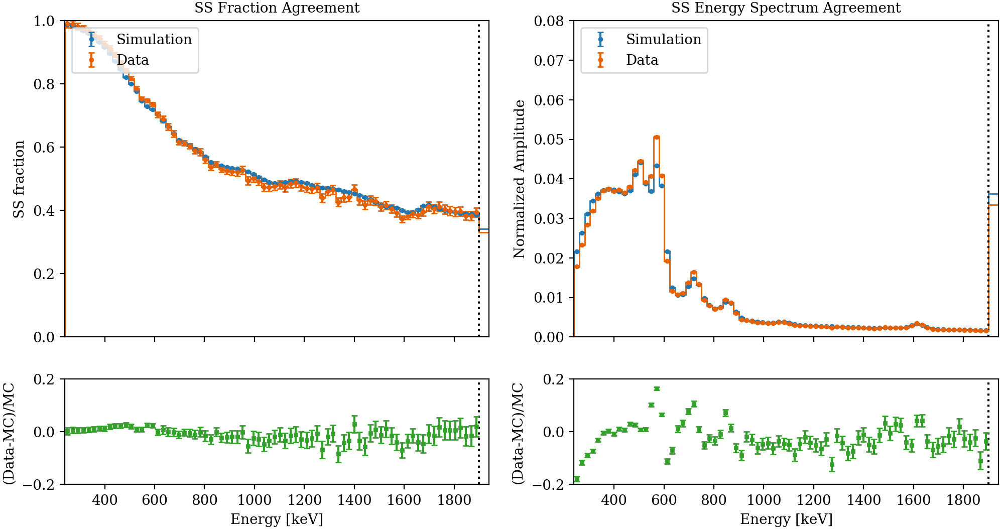

In [230]:
run_ssfrac(s="S8", th=240, source="Th-228", roi = 900, xmax = 1900)

### Source Position 11 ###

{'S11': {'MeanSSerr': [(0.09003825444745639, 0.0018357648415428323)],
  'MaxSSerr': [0.20220510750485685],
  'MeanSSerr ROI': [(0.05618833665261799, 0.00138107086872916)],
  'MaxSSerr ROI': [0.13842725490311134]}}

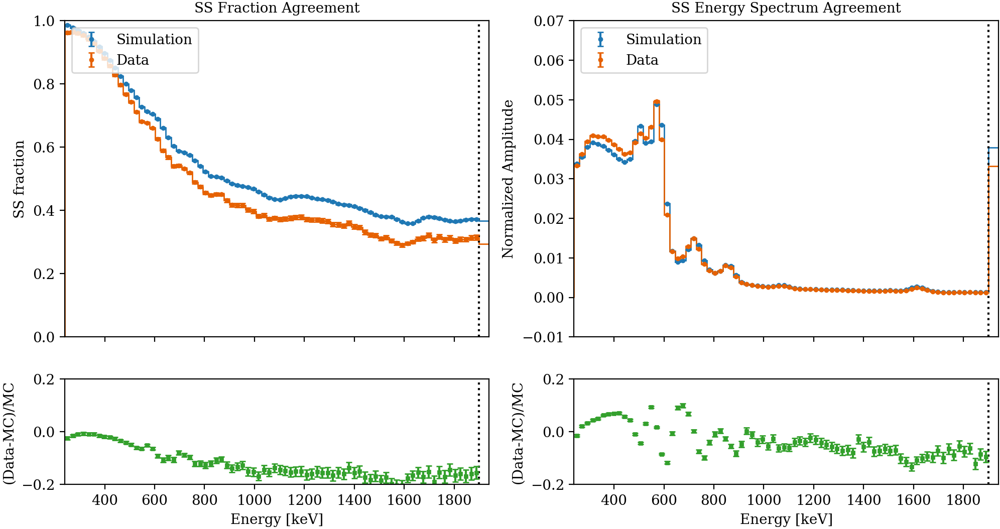

In [231]:
run_ssfrac(s="S11", th=240, source="Th-228", roi = 900, xmax = 1900)

## 300 keV ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.022863600931795135, 0.003447212925677665)],
  'MaxSSerr': [0.08593073234880048],
  'MeanSSerr ROI': [(0.017163179050338238, 0.002885043282262217)],
  'MaxSSerr ROI': [0.033526716961955964]}}

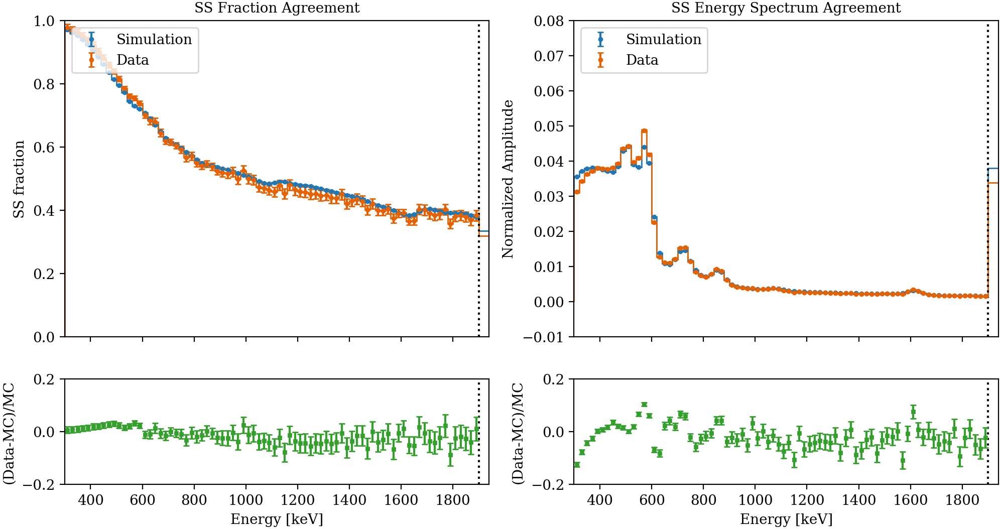

In [232]:
run_ssfrac(s="S2", th=300, source="Th-228", roi = 900, xmax = 1900)

### Source Position 5 ###

{'S5': {'MeanSSerr': [(0.034944095934660344, 0.0009185056917989838)],
  'MaxSSerr': [0.09728002687162106],
  'MeanSSerr ROI': [(0.01831887967981364, 0.0007153297594510432)],
  'MaxSSerr ROI': [0.056861015851819977]}}

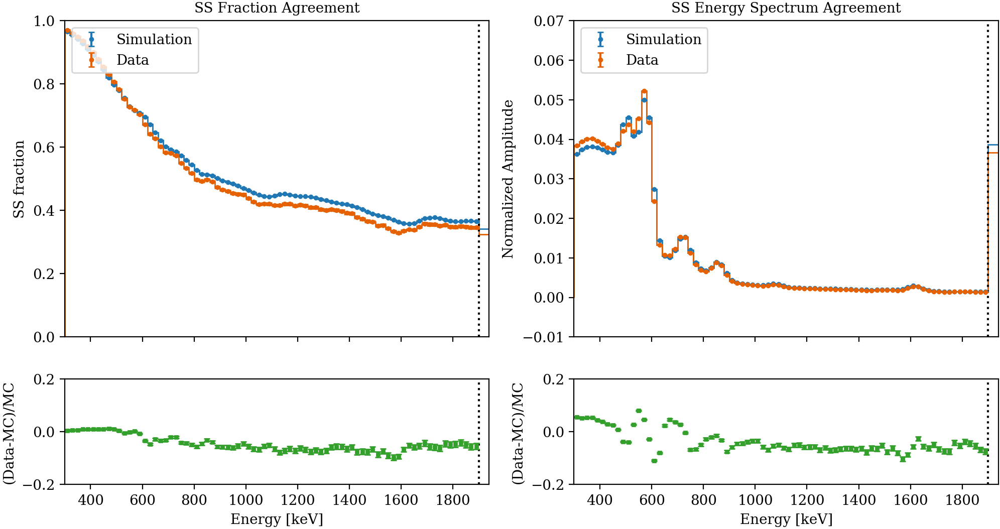

In [233]:
run_ssfrac(s="S5", th=300, source="Th-228", roi = 900, xmax = 1900)

### Source Position 8 ###

{'S8': {'MeanSSerr': [(0.019127519891285173, 0.0029985231112363018)],
  'MaxSSerr': [0.07464174214174216],
  'MeanSSerr ROI': [(0.014562377271082061, 0.002521288789989814)],
  'MaxSSerr ROI': [0.030630898276601325]}}

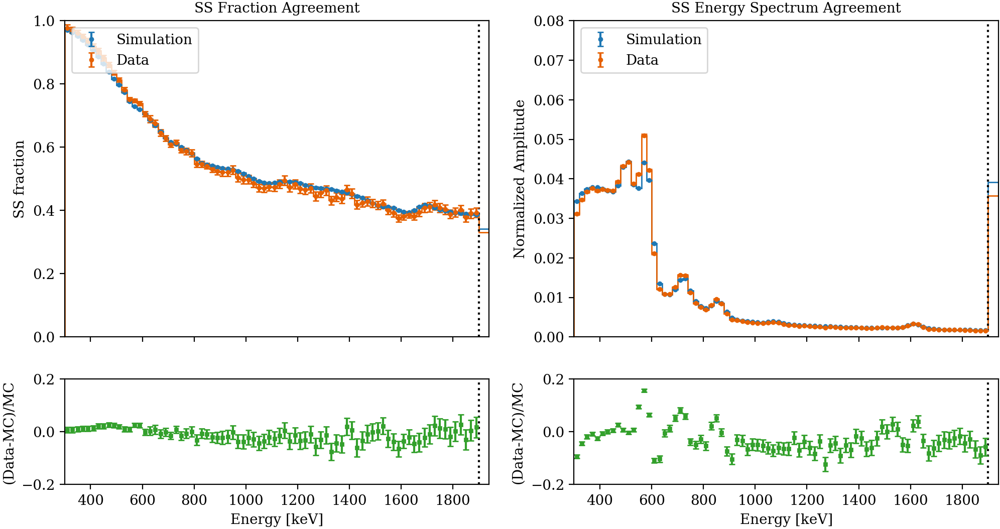

In [234]:
run_ssfrac(s="S8", th=300, source="Th-228", roi = 900, xmax = 1900)

### Source Position 11 ###

{'S11': {'MeanSSerr': [(0.09689695952831659, 0.0018973260361680188)],
  'MaxSSerr': [0.20128905680362413],
  'MeanSSerr ROI': [(0.0610021392529085, 0.0014487089772157067)],
  'MaxSSerr ROI': [0.14079700611941937]}}

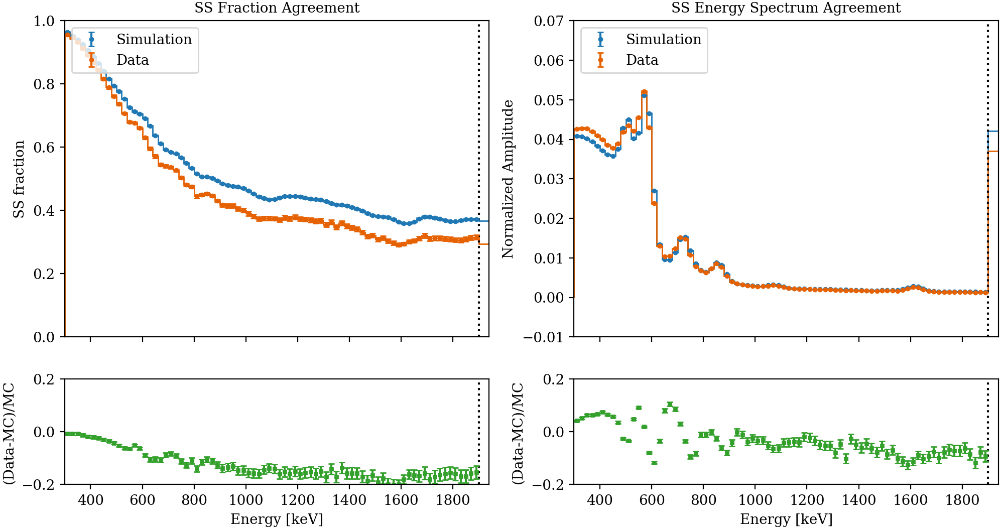

In [235]:
run_ssfrac(s="S11", th=300, source="Th-228", roi = 900, xmax = 1900)

In [159]:
Th_rates = []
Th_rates_err = []
for s in ["S2","S5","S8","S11"]:
    roo = uproot.open("/nfs/slac/g/exo_data8/exo_data/users/hpeltzsmalley/Xe134/shape/2019_Phase2_0nu_Ind_weekly/300/"
    +"SourceAgreement_2024_0vbb_Xe134_Nondenoised_3d_Th-228_"+s+".root")
    ratioroo = roo['energy_ss_ss_shape_ratio_no_low;1']
    ratiohist = ratioroo.to_numpy()
    ratioerr = ratioroo.errors()[ratiohist[1][:-1] < 3000]
    ratio = ratiohist[0][ratiohist[1][:-1] < 3000]
    avg_ratio = np.average(ratio,weights=1/ratioerr)
    avg_ratio_err = np.sqrt(sum([i**2 for i in ratioerr]))/len(ratioerr)
    Th_rates.append(avg_ratio-1)
    Th_rates_err.append(avg_ratio_err)
print(Th_rates)

[-0.010017195127718592, -0.017241592799584704, -0.014788697003124018, -0.01639296951206315]


## 320 keV ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.023242779428730344, 0.0034882958880308556)],
  'MaxSSerr': [0.08593057120511044],
  'MeanSSerr ROI': [(0.017558455969837277, 0.0029597873479322396)],
  'MaxSSerr ROI': [0.03352997347606081]}}

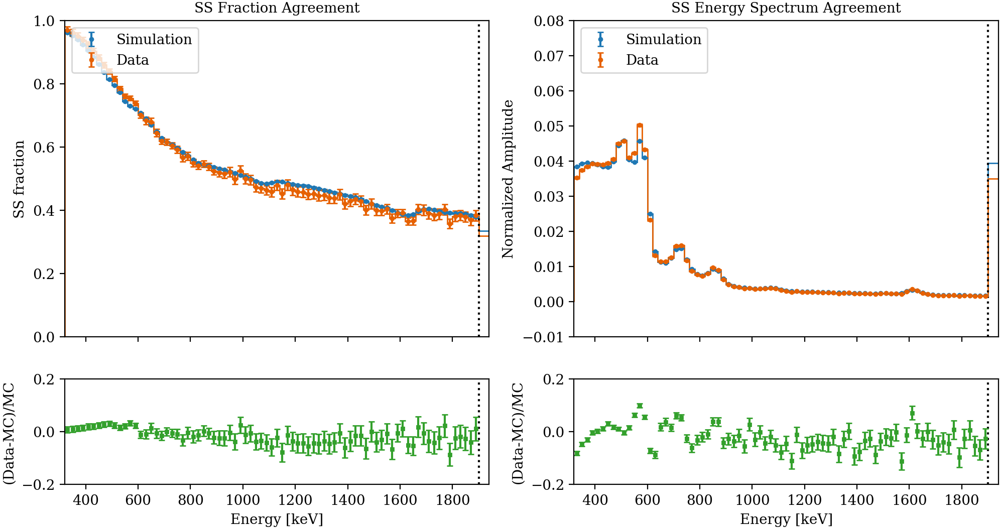

In [11]:
run_ssfrac(s="S2", th=320, source="Th-228", roi = 900, xmax = 1900)

### Source Position 5 ###

{'S5': {'MeanSSerr': [(0.035745519090085366, 0.000929656857063706)],
  'MaxSSerr': [0.09728003193660348],
  'MeanSSerr ROI': [(0.018877273664383572, 0.0007347691121635423)],
  'MaxSSerr ROI': [0.05686102003130352]}}

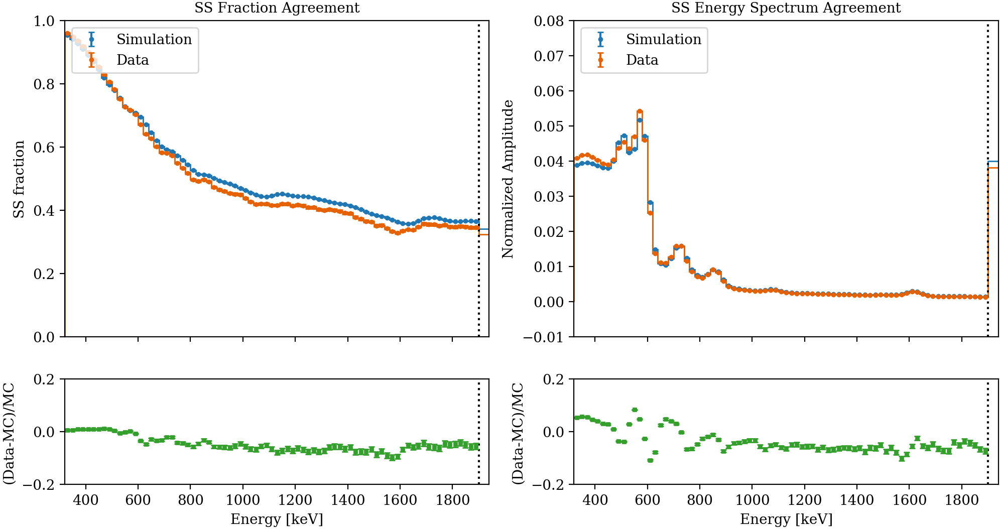

In [12]:
run_ssfrac(s="S5", th=320, source="Th-228", roi = 900, xmax = 1900)

### Source Position 8 ###

{'S8': {'MeanSSerr': [(0.01941107339534146, 0.0030342894253672214)],
  'MaxSSerr': [0.07464181644390644],
  'MeanSSerr ROI': [(0.0148439281464074, 0.002587144761519651)],
  'MaxSSerr ROI': [0.030633281886579312]}}

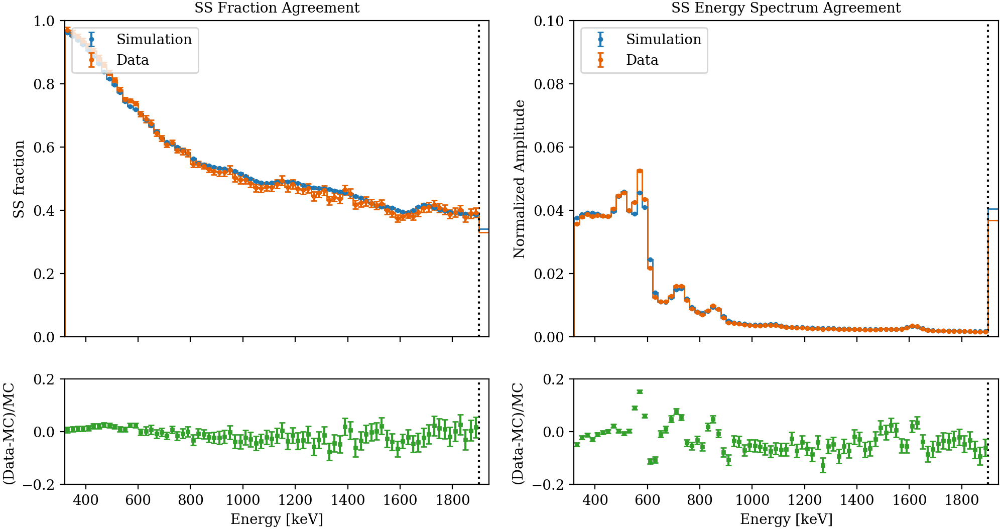

In [13]:
run_ssfrac(s="S8", th=320, source="Th-228", roi = 900, xmax = 1900)

### Source Position 11 ###

{'S11': {'MeanSSerr': [(0.09946194925664995, 0.0019204532849150656)],
  'MaxSSerr': [0.20129076516843203],
  'MeanSSerr ROI': [(0.0634570335602183, 0.0014890204957871034)],
  'MaxSSerr ROI': [0.140799536528606]}}

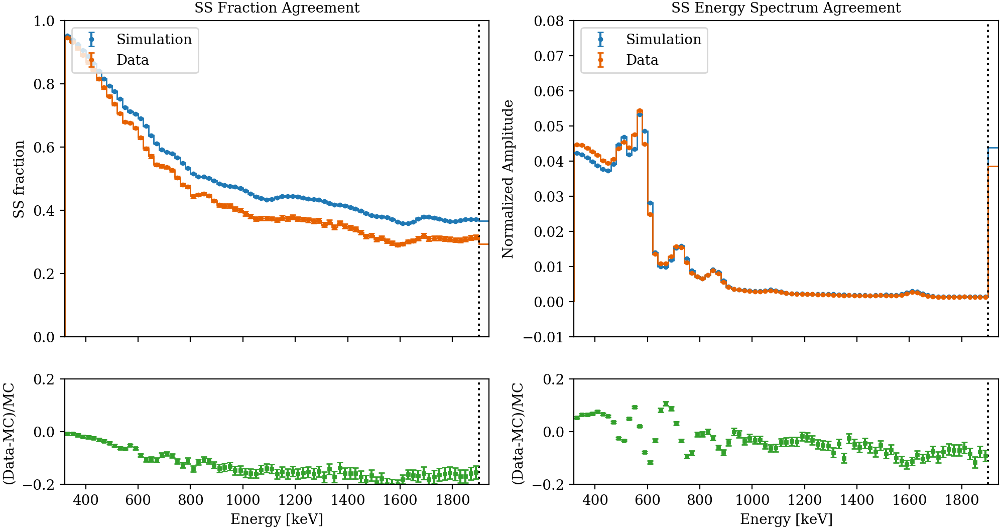

In [14]:
run_ssfrac(s="S11", th=320, source="Th-228", roi = 900, xmax = 1900)

In [16]:
Th_rates_320 = []
Th_rates_320_err = []
for s in ["S2","S5","S8","S11"]:
    roo = uproot.open("/nfs/slac/g/exo_data8/exo_data/users/hpeltzsmalley/Xe134/shape/2019_Phase2_0nu_Ind_weekly/320/"
    +"SourceAgreement_2024_0vbb_Xe134_Nondenoised_3d_Th-228_"+s+".root")
    ratioroo = roo['energy_ss_ss_shape_ratio_no_low;1']
    ratiohist = ratioroo.to_numpy()
    ratioerr = ratioroo.errors()[ratiohist[1][:-1] < 900]
    ratio = ratiohist[0][ratiohist[1][:-1] < 900]
    avg_ratio = np.average(ratio,weights=1/ratioerr)
    avg_ratio_err = np.sqrt(sum([i**2 for i in ratioerr]))/len(ratioerr)
    Th_rates_320.append(avg_ratio-1)
    Th_rates_320_err.append(avg_ratio_err)
print(Th_rates_320)

[0.0038796714221012163, 0.006493604968883515, 0.0025763703552967865, 0.015318586848645843]


## 340 keV ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.02357920171724523, 0.0035306298899951635)],
  'MaxSSerr': [0.08593055018566192],
  'MeanSSerr ROI': [(0.017874557677056042, 0.003041573064425322)],
  'MaxSSerr ROI': [0.03353155449095065]}}

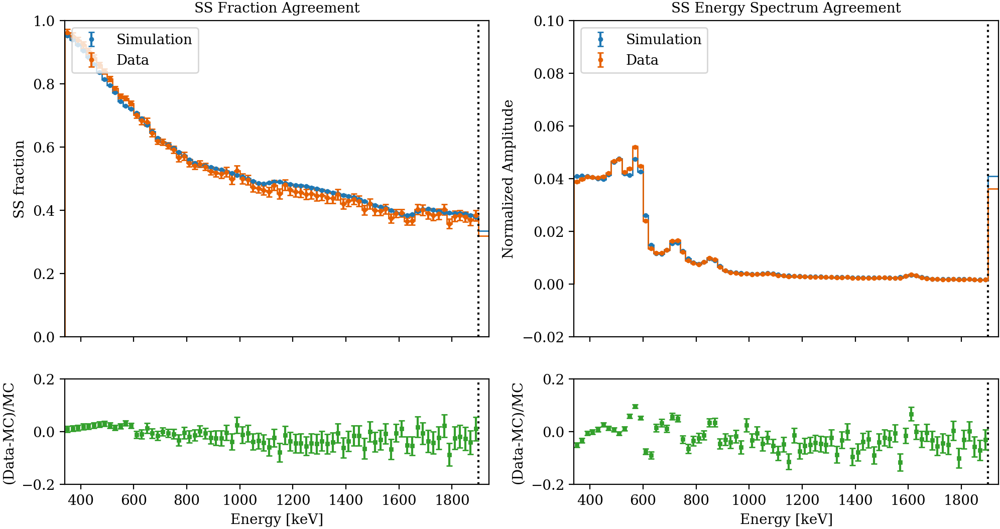

In [236]:
run_ssfrac(s="S2", th=340, source="Th-228", roi = 900, xmax = 1900)

### Source Position 5 ###

{'S5': {'MeanSSerr': [(0.03655302390208919, 0.0009411127015939895)],
  'MaxSSerr': [0.09728003757836713],
  'MeanSSerr ROI': [(0.0194132667848398, 0.0007557521825541667)],
  'MaxSSerr ROI': [0.05686102468673069]}}

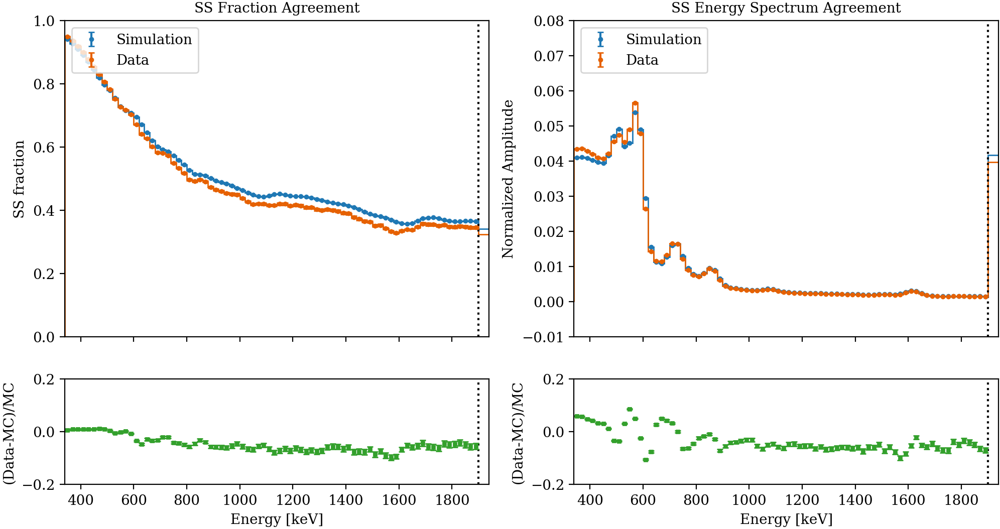

In [237]:
run_ssfrac(s="S5", th=340, source="Th-228", roi = 900, xmax = 1900)

### Source Position 8 ###

{'S8': {'MeanSSerr': [(0.019671384402290017, 0.003071143881357369)],
  'MaxSSerr': [0.07464190868856202],
  'MeanSSerr ROI': [(0.015079441448003847, 0.002659144510583435)],
  'MaxSSerr ROI': [0.03063476930934066]}}

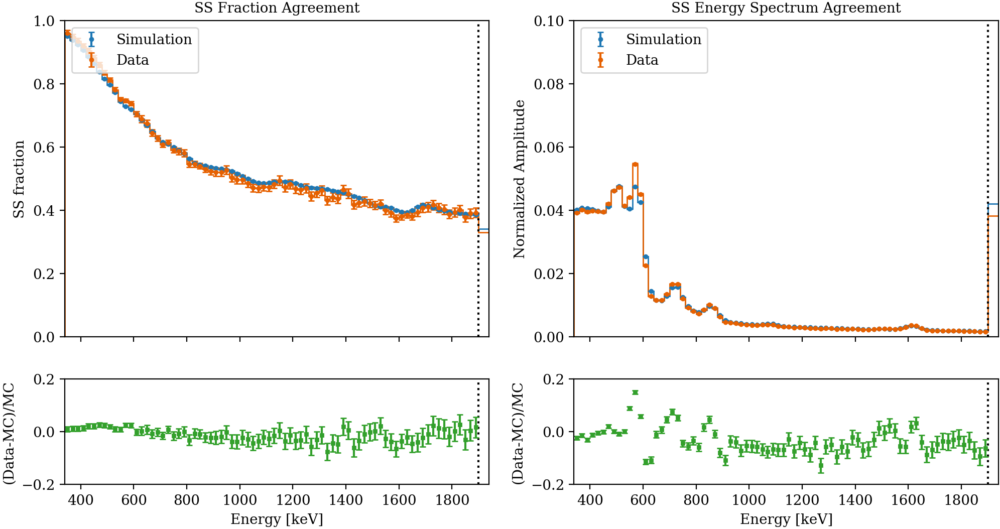

In [238]:
run_ssfrac(s="S8", th=340, source="Th-228", roi = 900, xmax = 1900)

### Source Position 11 ###

{'S11': {'MeanSSerr': [(0.10218005135230011, 0.0019442076438478035)],
  'MaxSSerr': [0.20129299783977103],
  'MeanSSerr ROI': [(0.06614613992563217, 0.00153230414989592)],
  'MaxSSerr ROI': [0.14080444705497344]}}

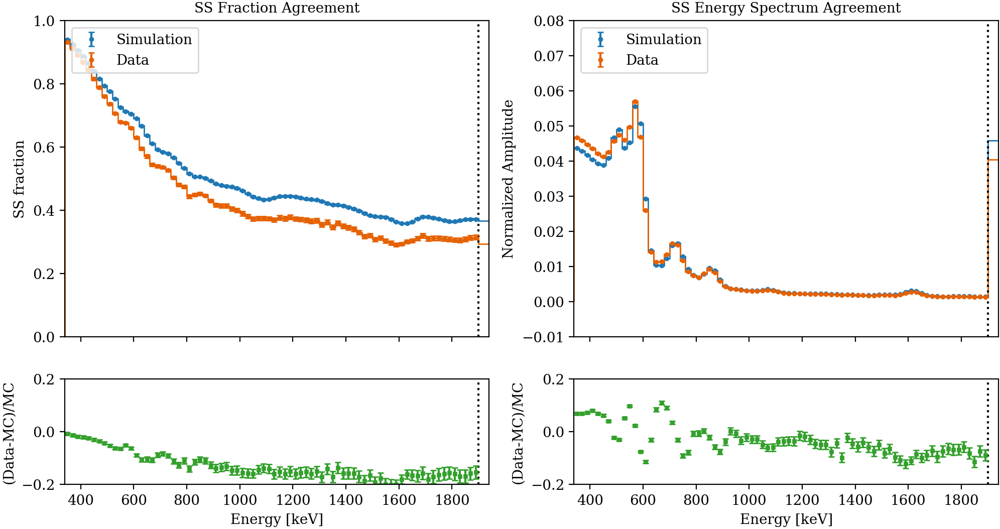

In [239]:
run_ssfrac(s="S11", th=340, source="Th-228", roi = 900, xmax = 1900)

## 360 keV ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.023875826584300604, 0.0035741655961015464)],
  'MaxSSerr': [0.08593061594975498],
  'MeanSSerr ROI': [(0.018115582935594565, 0.0031302440891662195)],
  'MaxSSerr ROI': [0.03353216367089175]}}

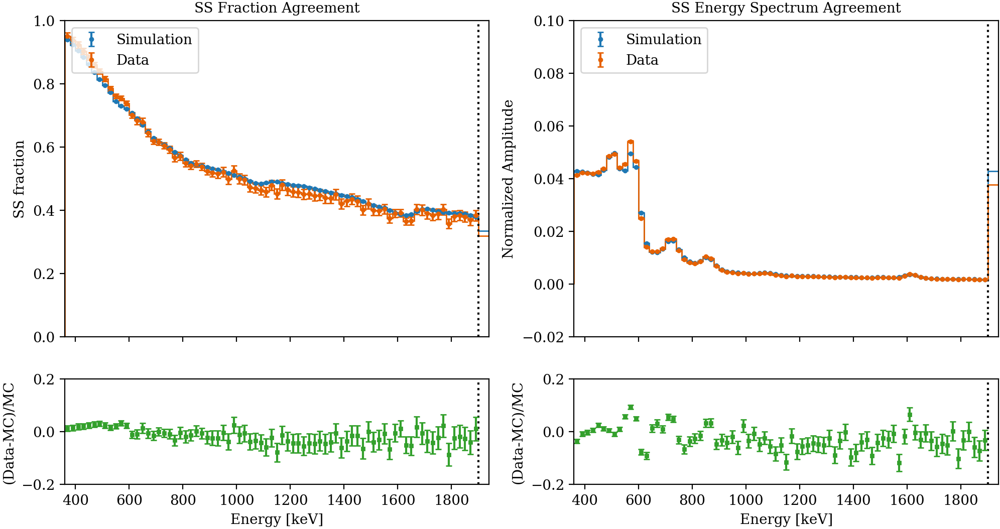

In [29]:
run_ssfrac(s="S2", th=360, source="Th-228", roi = 900, xmax = 1900)

### Source Position 5 ###

{'S5': {'MeanSSerr': [(0.037339849330861666, 0.000952876254930567)],
  'MaxSSerr': [0.09728004379713528],
  'MeanSSerr ROI': [(0.019883277309536335, 0.0007783653119716953)],
  'MaxSSerr ROI': [0.05686102981828579]}}

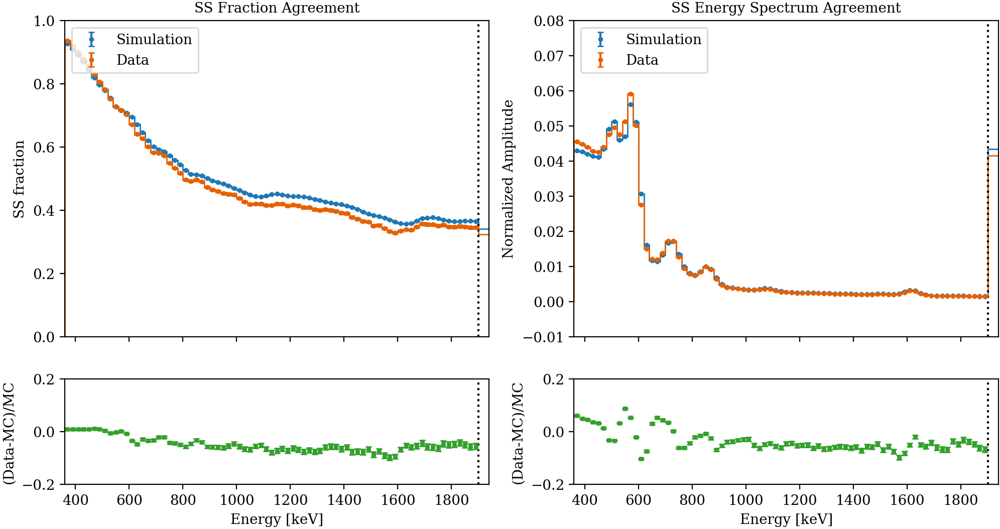

In [30]:
run_ssfrac(s="S5", th=360, source="Th-228", roi = 900, xmax = 1900)

### Source Position 8 ###

{'S8': {'MeanSSerr': [(0.019894044801390048, 0.003109045949209275)],
  'MaxSSerr': [0.07464201773256317],
  'MeanSSerr ROI': [(0.015244028471980503, 0.0027371596264740197)],
  'MaxSSerr ROI': [0.03063436127879008]}}

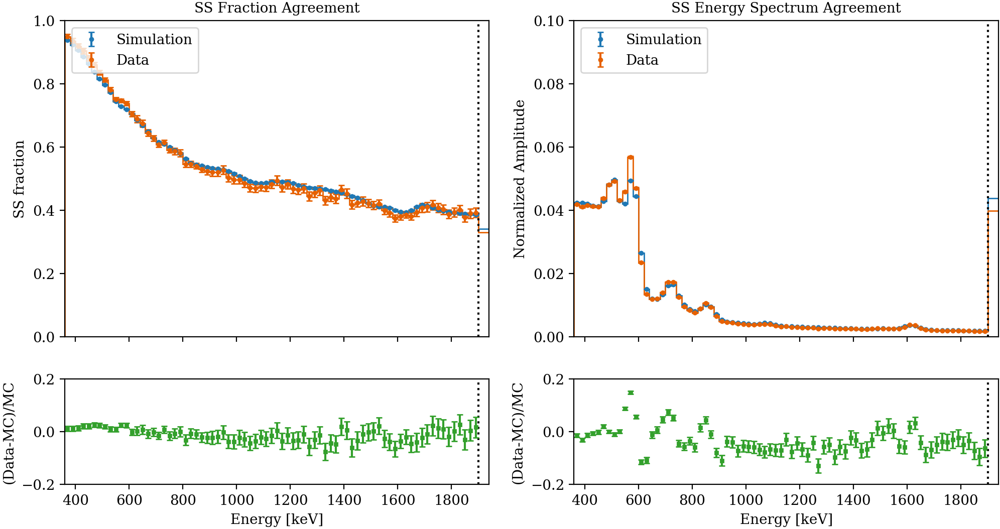

In [31]:
run_ssfrac(s="S8", th=360, source="Th-228", roi = 900, xmax = 1900)

### Source Position 11 ###

{'S11': {'MeanSSerr': [(0.10489661070516973, 0.0019685807681816235)],
  'MaxSSerr': [0.20129415627913722],
  'MeanSSerr ROI': [(0.06883773050072463, 0.0015787172020850072)],
  'MaxSSerr ROI': [0.14080778457725343]}}

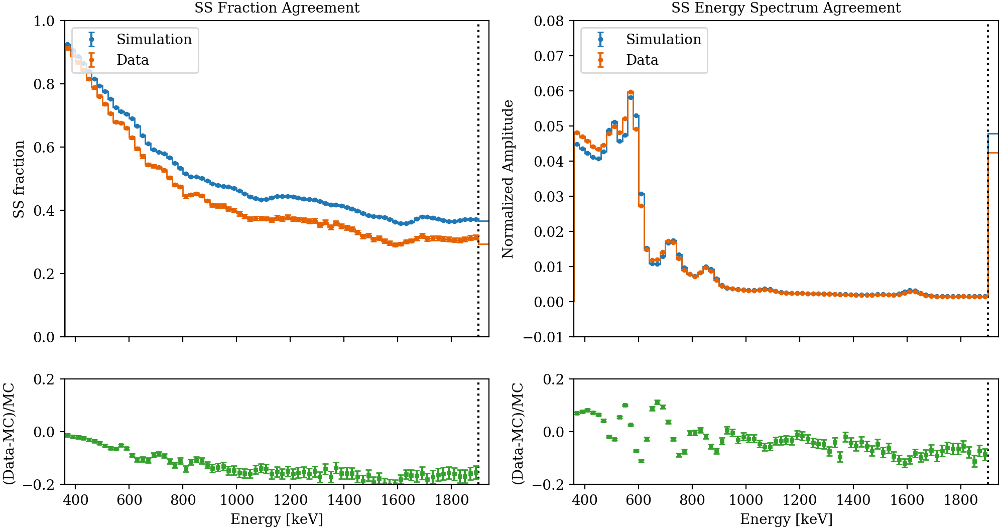

In [32]:
run_ssfrac(s="S11", th=360, source="Th-228", roi = 900, xmax = 1900)

## 380 ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.024122332882393578, 0.0036189472096695772)],
  'MaxSSerr': [0.08593088815784013],
  'MeanSSerr ROI': [(0.01825786134008173, 0.003226602065396394)],
  'MaxSSerr ROI': [0.03352946160262811]}}

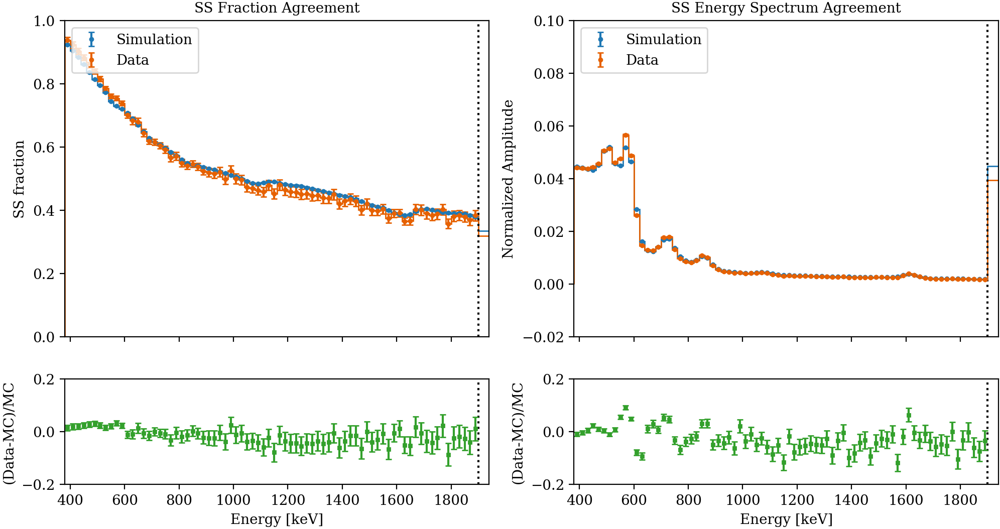

In [25]:
run_ssfrac(s="S2", th=380, source="Th-228", roi = 900, xmax = 1900)

### Source Position 5 ###

{'S5': {'MeanSSerr': [(0.038165703683813494, 0.0009649484082159103)],
  'MaxSSerr': [0.09728005060262228],
  'MeanSSerr ROI': [(0.02039053184171366, 0.0008026801228607421)],
  'MaxSSerr ROI': [0.0568610354339856]}}

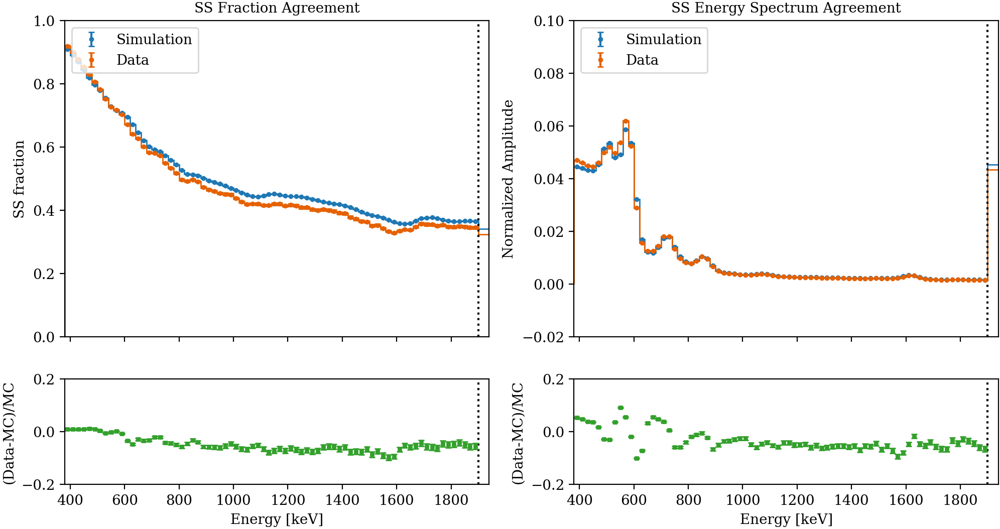

In [26]:
run_ssfrac(s="S5", th=380, source="Th-228", roi = 900, xmax = 1900)

### Source Position 8 ###

{'S8': {'MeanSSerr': [(0.020091844906922573, 0.0031479146039716365)],
  'MaxSSerr': [0.07464214083128004],
  'MeanSSerr ROI': [(0.015359703875333855, 0.0028209172761654495)],
  'MaxSSerr ROI': [0.030634076342099057]}}

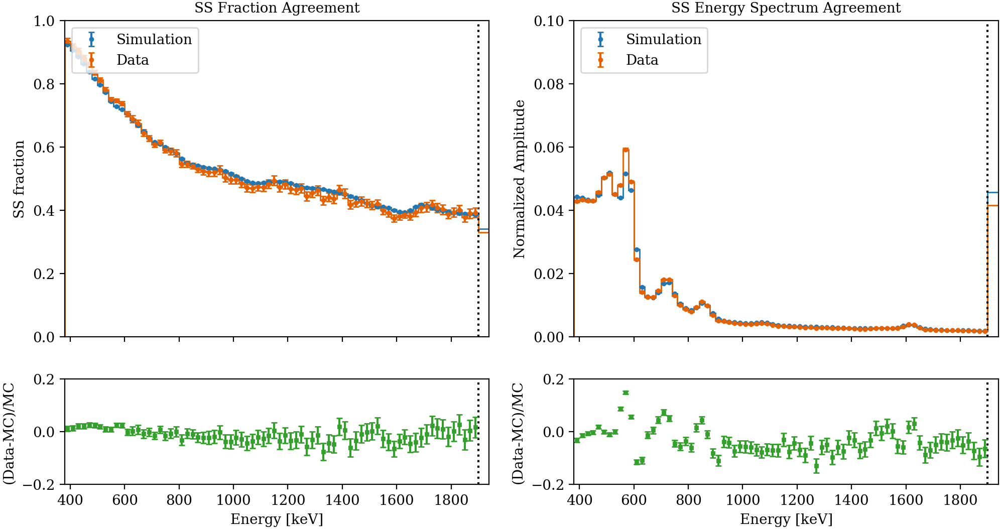

In [27]:
run_ssfrac(s="S8", th=380, source="Th-228", roi = 900, xmax = 1900)

### Source Position 11 ###

{'S11': {'MeanSSerr': [(0.10761433704879961, 0.0019935659202777404)],
  'MaxSSerr': [0.20129432140454528],
  'MeanSSerr ROI': [(0.07154129832241395, 0.0016285475314273706)],
  'MaxSSerr ROI': [0.14080956023880256]}}

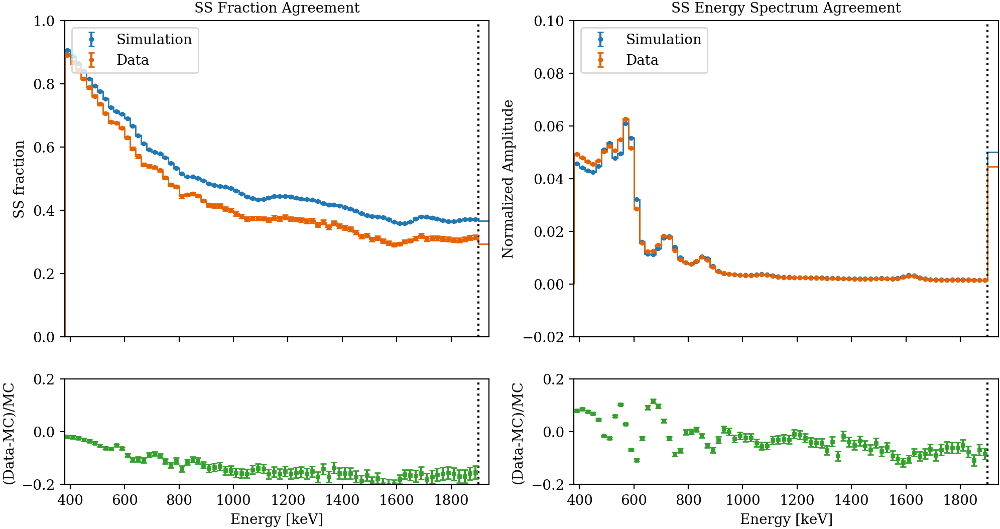

In [28]:
run_ssfrac(s="S11", th=380, source="Th-228", roi = 900, xmax = 1900)

## 400 keV ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.024248902242651627, 0.0036649443957223935)],
  'MaxSSerr': [0.08593115815338466],
  'MeanSSerr ROI': [(0.018277776764351127, 0.003374681070675656)],
  'MaxSSerr ROI': [0.03352861903553026]}}

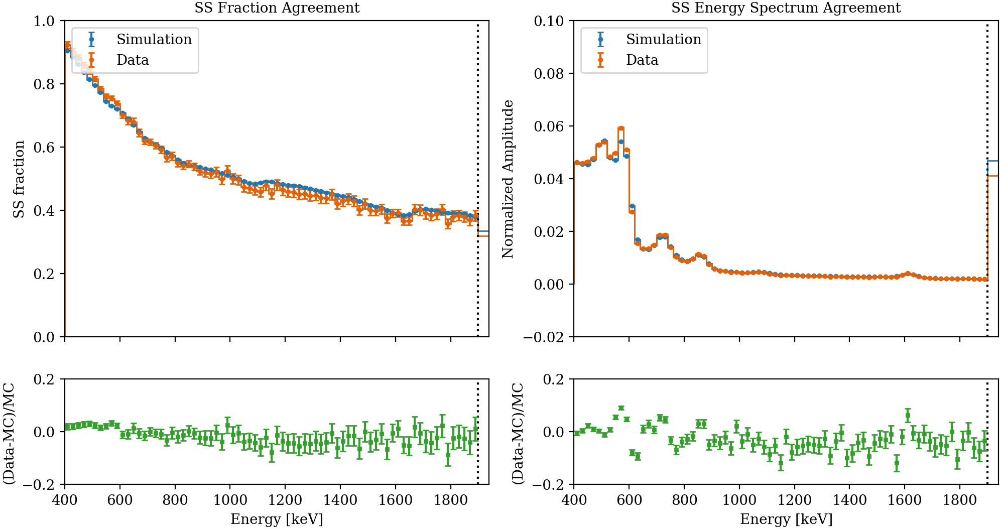

In [21]:
run_ssfrac(s="S2", th=400, source="Th-228", roi = 900, xmax = 1900)

### Source Position 5 ###

{'S5': {'MeanSSerr': [(0.03904195189094268, 0.0009773390740215704)],
  'MaxSSerr': [0.09728005799176498],
  'MeanSSerr ROI': [(0.021683228233462595, 0.0008440663396320698)],
  'MaxSSerr ROI': [0.057360196436779774]}}

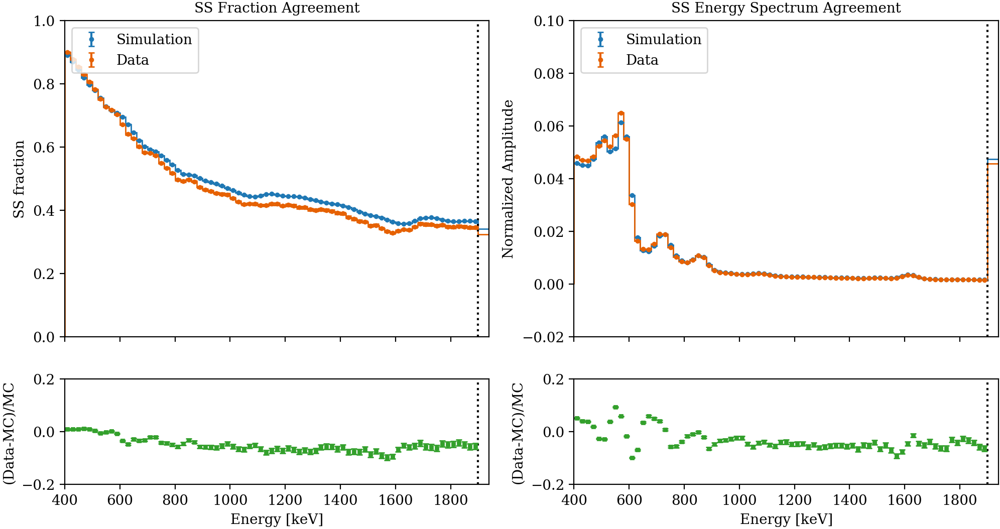

In [22]:
run_ssfrac(s="S5", th=400, source="Th-228", roi = 900, xmax = 1900)

### Source Position 8 ###

{'S8': {'MeanSSerr': [(0.020261272059816746, 0.003187895868506532)],
  'MaxSSerr': [0.07464229605397685],
  'MeanSSerr ROI': [(0.015540267693065908, 0.0029615941824922844)],
  'MaxSSerr ROI': [0.030633910350587226]}}

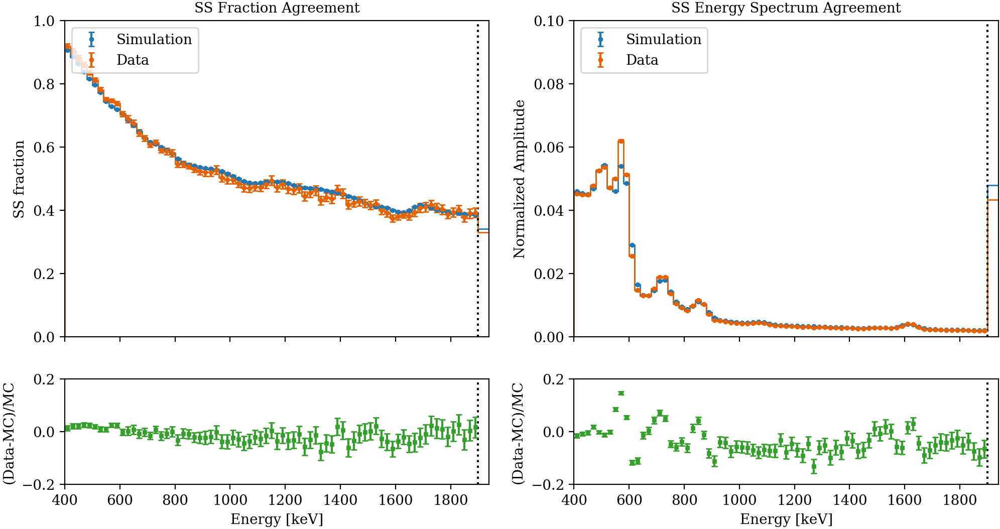

In [23]:
run_ssfrac(s="S8", th=400, source="Th-228", roi = 900, xmax = 1900)

### Source Position 11 ###

{'S11': {'MeanSSerr': [(0.11039694635513583, 0.0020192206414874157)],
  'MaxSSerr': [0.2012947671744776],
  'MeanSSerr ROI': [(0.07562492125697505, 0.0017151541267985014)],
  'MaxSSerr ROI': [0.14081319544814389]}}

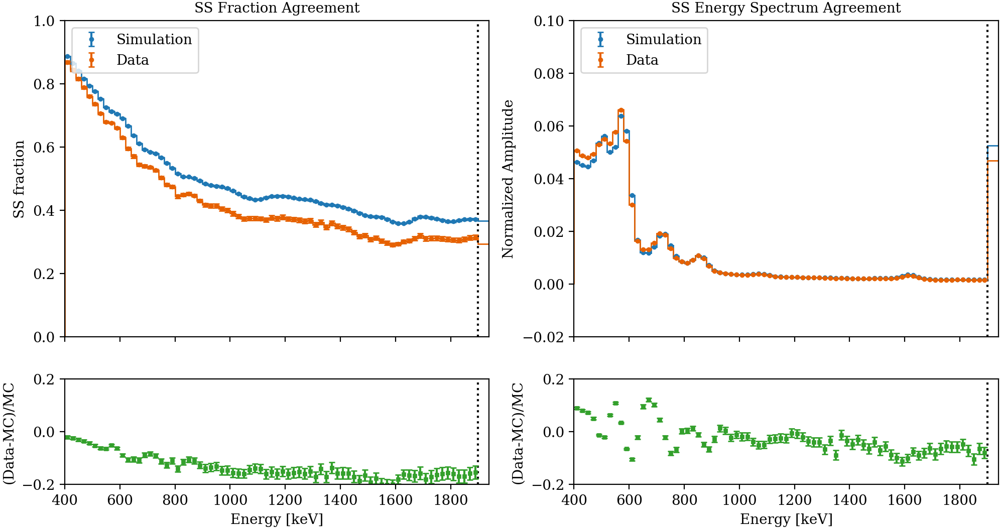

In [24]:
run_ssfrac(s="S11", th=400, source="Th-228", roi = 900, xmax = 1900)

# Ra-226 #

In [37]:
Rn = {"S2":{"MeanSSerr":[],"MaxSSerr":[],"MeanSSerr ROI":[],"MaxSSerr ROI":[]},"S5":{"MeanSSerr":[],"MaxSSerr":[],"MeanSSerr ROI":[],"MaxSSerr ROI":[]},"S8":{"MeanSSerr":[],"MaxSSerr":[],"MeanSSerr ROI":[],"MaxSSerr ROI":[]}}

## 240 keV ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.030045744756809777, 0.004290919139174606)],
  'MaxSSerr': [0.13700367620696868],
  'MeanSSerr ROI': [(0.017414350897848534, 0.003795222896811982)],
  'MaxSSerr ROI': [0.041999893732814327]}}

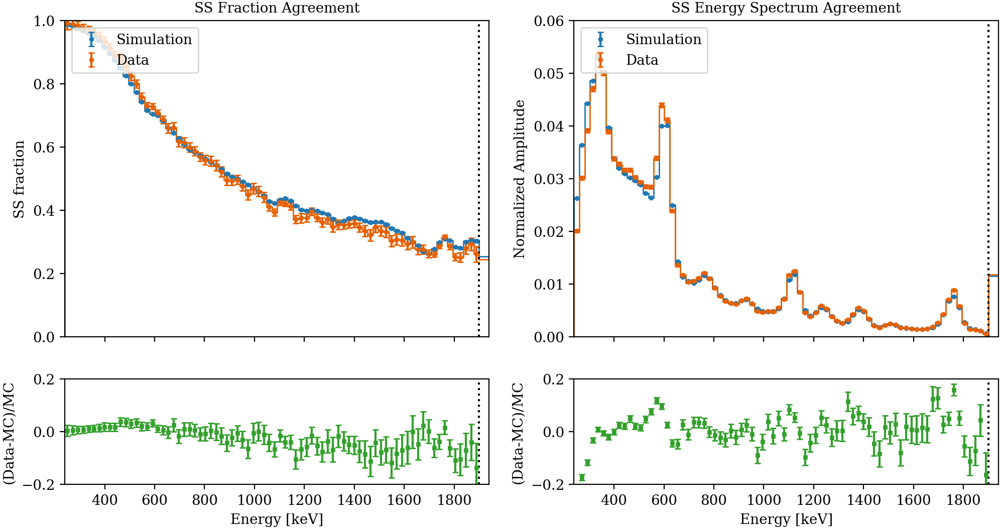

In [7]:
run_ssfrac(s="S2", th=240, source="Ra-226", roi = 900, xmax = 1900)

### Source Position 5 ###

{'S5': {'MeanSSerr': [(0.017678490567521448, 0.0013244814940937804)],
  'MaxSSerr': [0.044598122314168376],
  'MeanSSerr ROI': [(0.02336908770076576, 0.0011595341526862571)],
  'MaxSSerr ROI': [0.044598122314168376]}}

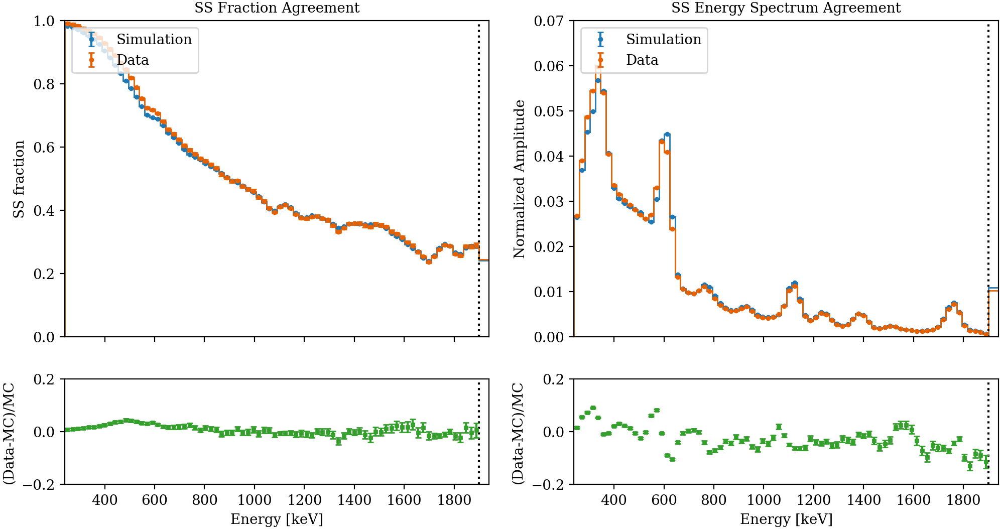

In [8]:
run_ssfrac(s="S5", th=240, source="Ra-226", roi = 900, xmax = 1900)

### Source Position 8 ###

{'S8': {'MeanSSerr': [(0.025192314760844648, 0.0043581824308268294)],
  'MaxSSerr': [0.1145194859158049],
  'MeanSSerr ROI': [(0.017757514050377225, 0.003882012907681543)],
  'MaxSSerr ROI': [0.035397870111170376]}}

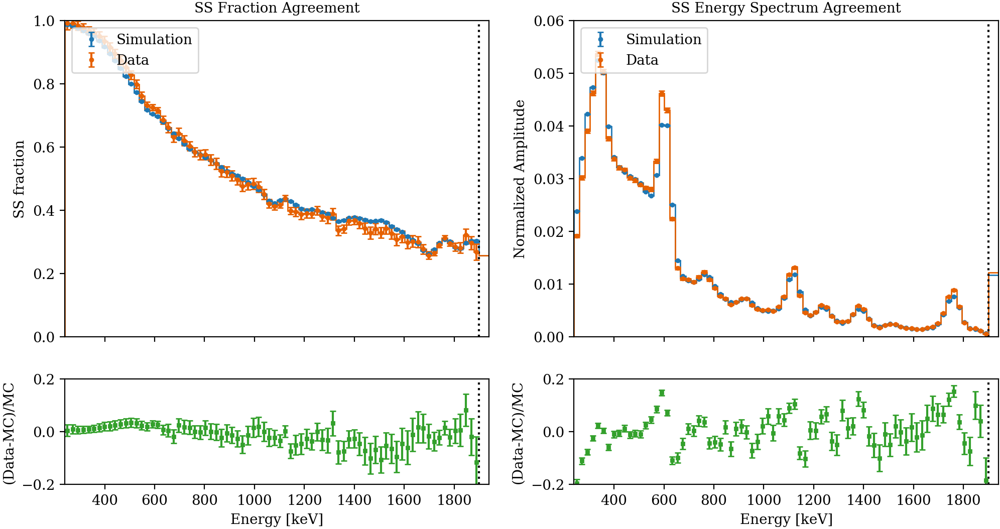

In [9]:
run_ssfrac(s="S8", th=240, source="Ra-226", roi = 900, xmax = 1900)

## 300 keV ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.030978339445424812, 0.004442607166206763)],
  'MaxSSerr': [0.15282401436207077],
  'MeanSSerr ROI': [(0.018193373182873018, 0.004070550941461227)],
  'MaxSSerr ROI': [0.03945156648912615]}}

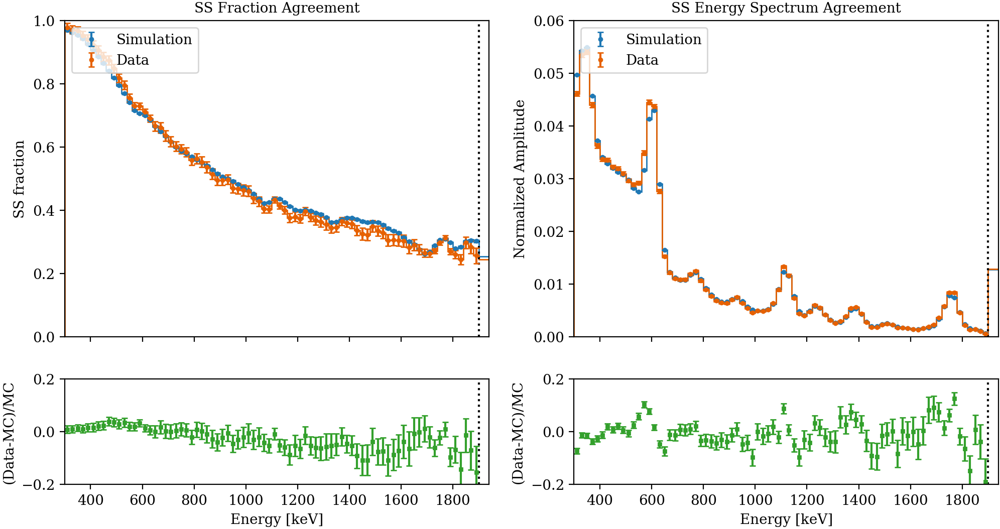

In [10]:
run_ssfrac(s="S2", th=300, source="Ra-226", roi = 900, xmax = 1900)

### Source Position 5 ###

{'S5': {'MeanSSerr': [(0.01802935032662207, 0.0013077700302220685)],
  'MaxSSerr': [0.044815750628875786],
  'MeanSSerr ROI': [(0.025108846129599814, 0.0011908023761609545)],
  'MaxSSerr ROI': [0.044815750628875786]}}

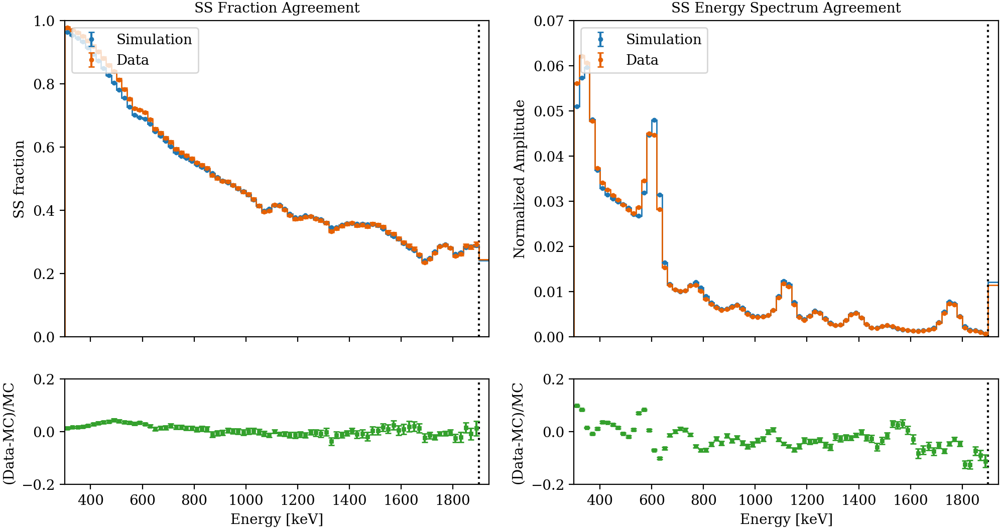

In [11]:
run_ssfrac(s="S5", th=300, source="Ra-226", roi = 900, xmax = 1900)

### Source Position 8 ###

{'S8': {'MeanSSerr': [(0.026317762577892853, 0.0045118380229218205)],
  'MaxSSerr': [0.11221060903832722],
  'MeanSSerr ROI': [(0.01887114720440507, 0.0041692934926716866)],
  'MaxSSerr ROI': [0.039984061980422335]}}

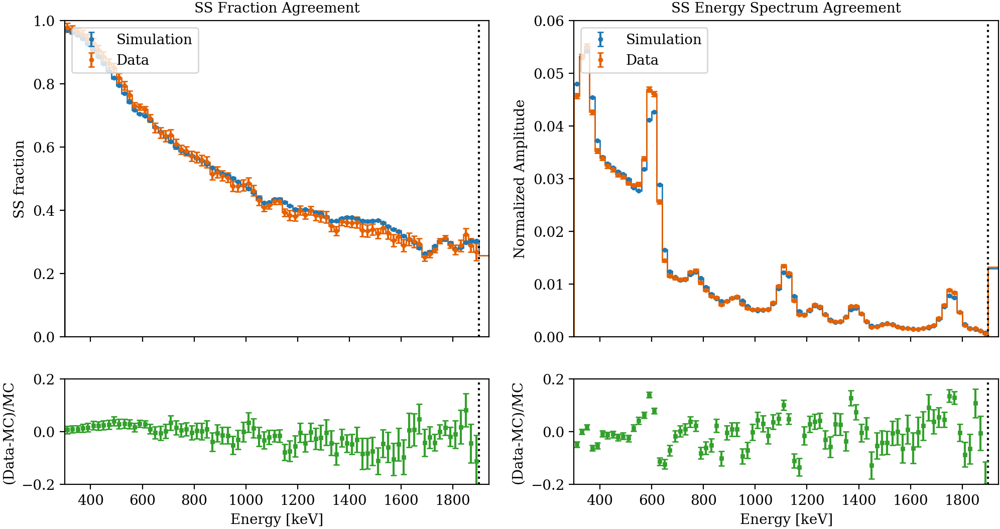

In [12]:
run_ssfrac(s="S8", th=300, source="Ra-226", roi = 900, xmax = 1900)

In [158]:
Ra_rates = []
Ra_rates_err = []
for s in ["S2","S5","S8"]:
    roo = uproot.open("/nfs/slac/g/exo_data8/exo_data/users/hpeltzsmalley/Xe134/shape/2019_Phase2_0nu_Ind_weekly/300/"
    +"SourceAgreement_2024_0vbb_Xe134_Nondenoised_3d_Ra-226_"+s+".root")
    ratioroo = roo['energy_ss_ss_shape_ratio_no_low;1']
    ratiohist = ratioroo.to_numpy()
    ratioerr = ratioroo.errors()[ratiohist[1][:-1] < 3000]
    ratio = ratiohist[0][ratiohist[1][:-1] < 3000]
    avg_ratio = np.average(ratio,weights=1/ratioerr)
    avg_ratio_err = np.sqrt(sum([i**2 for i in ratioerr]))/len(ratioerr)
    Ra_rates.append(avg_ratio-1)
    Ra_rates_err.append(avg_ratio_err)
print(Ra_rates)

[-0.0027868118388048035, -0.014099792925738042, -0.002718010604633947]


## 320 keV ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.03156551819831609, 0.004496431414833574)],
  'MaxSSerr': [0.15282965303596935],
  'MeanSSerr ROI': [(0.018609274714152572, 0.004189931459422507)],
  'MaxSSerr ROI': [0.03945209427481162]}}

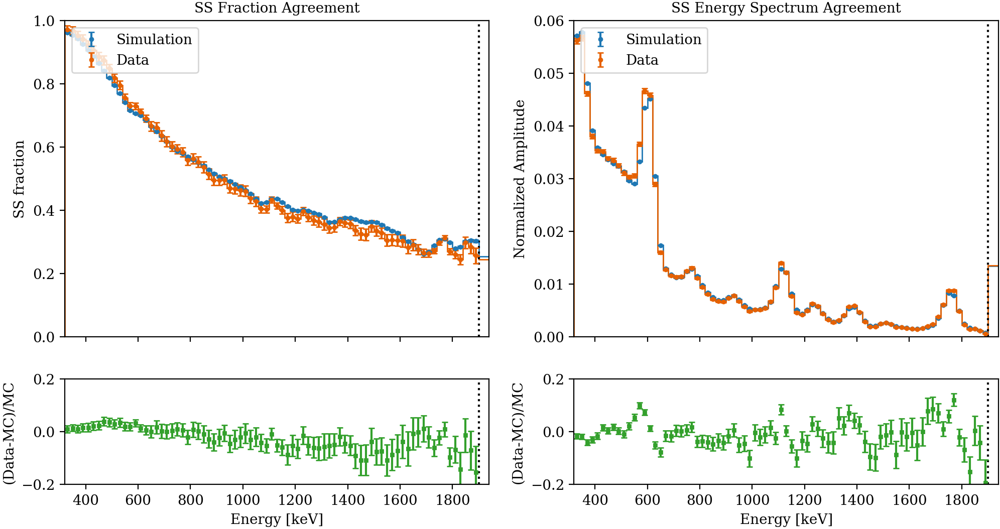

In [17]:
run_ssfrac(s="S2", th=320, source="Ra-226", roi = 900, xmax = 1900)

### Source Position 5 ###

{'S5': {'MeanSSerr': [(0.018056428187313255, 0.0013237824093541236)],
  'MaxSSerr': [0.044815685316947546],
  'MeanSSerr ROI': [(0.02556498925917462, 0.0012270347981479508)],
  'MaxSSerr ROI': [0.044815685316947546]}}

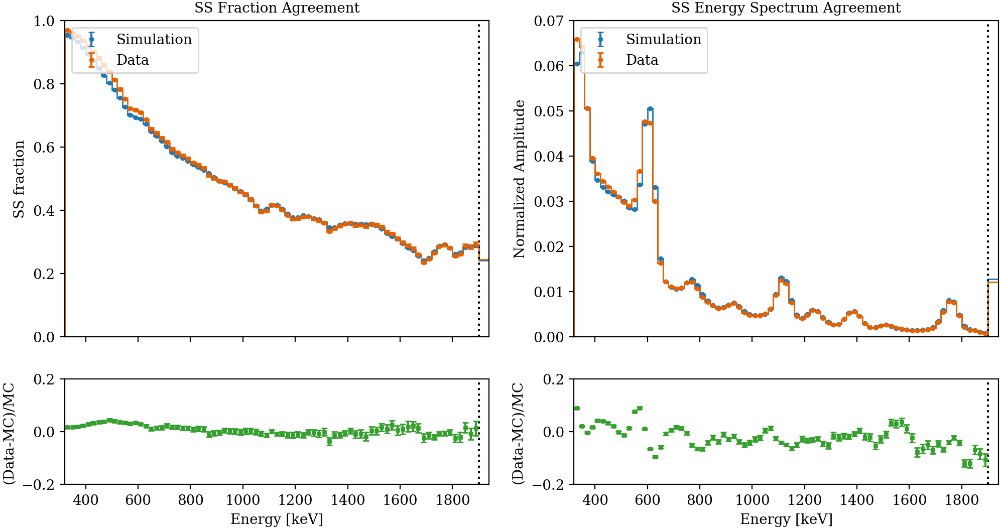

In [19]:
run_ssfrac(s="S5", th=320, source="Ra-226", roi = 900, xmax = 1900)

### Source Position 8 ###

{'S8': {'MeanSSerr': [(0.026778623789635213, 0.004566437264684383)],
  'MaxSSerr': [0.1122172513209031],
  'MeanSSerr ROI': [(0.019338258448421977, 0.004291505356437717)],
  'MaxSSerr ROI': [0.03998401021065789]}}

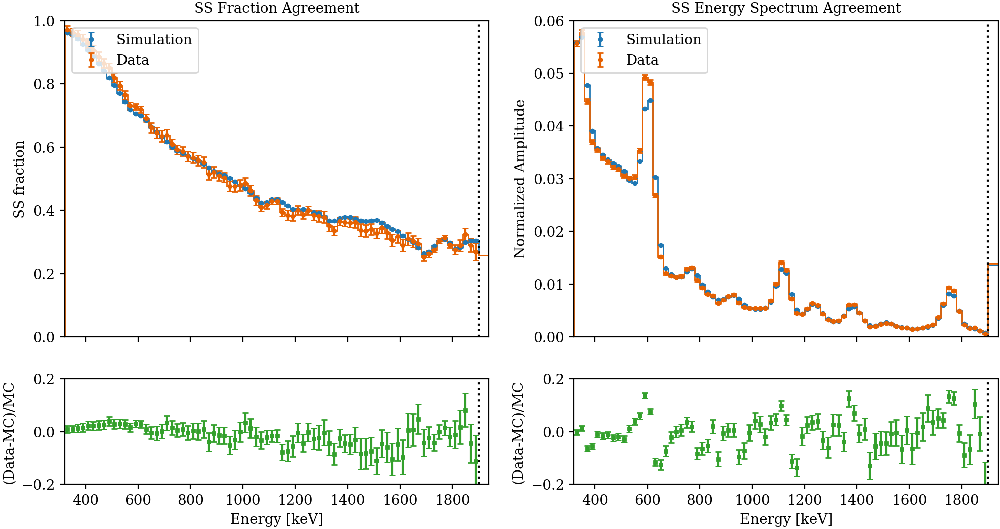

In [21]:
run_ssfrac(s="S8", th=320, source="Ra-226", roi = 900, xmax = 1900)

In [22]:
Ra_rates_320 = []
Ra_rates_320_err = []
for s in ["S2","S5","S8"]:
    roo = uproot.open("/nfs/slac/g/exo_data8/exo_data/users/hpeltzsmalley/Xe134/shape/2019_Phase2_0nu_Ind_weekly/320/"
    +"SourceAgreement_2024_0vbb_Xe134_Nondenoised_3d_Ra-226_"+s+".root")
    ratioroo = roo['energy_ss_ss_shape_ratio_no_low;1']
    ratiohist = ratioroo.to_numpy()
    ratioerr = ratioroo.errors()[ratiohist[1][:-1] < 900]
    ratio = ratiohist[0][ratiohist[1][:-1] < 900]
    avg_ratio = np.average(ratio,weights=1/ratioerr)
    avg_ratio_err = np.sqrt(sum([i**2 for i in ratioerr]))/len(ratioerr)
    Ra_rates_320.append(avg_ratio-1)
    Ra_rates_320_err.append(avg_ratio_err)
print(Ra_rates_320)

[-0.0030942091557837337, 0.004009997628604545, -0.011167481042418381]


## 340 keV ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.03205023919639569, 0.004551695319682724)],
  'MaxSSerr': [0.15283022323498763],
  'MeanSSerr ROI': [(0.018806456566616954, 0.004318321924583139)],
  'MaxSSerr ROI': [0.039451448434688695]}}

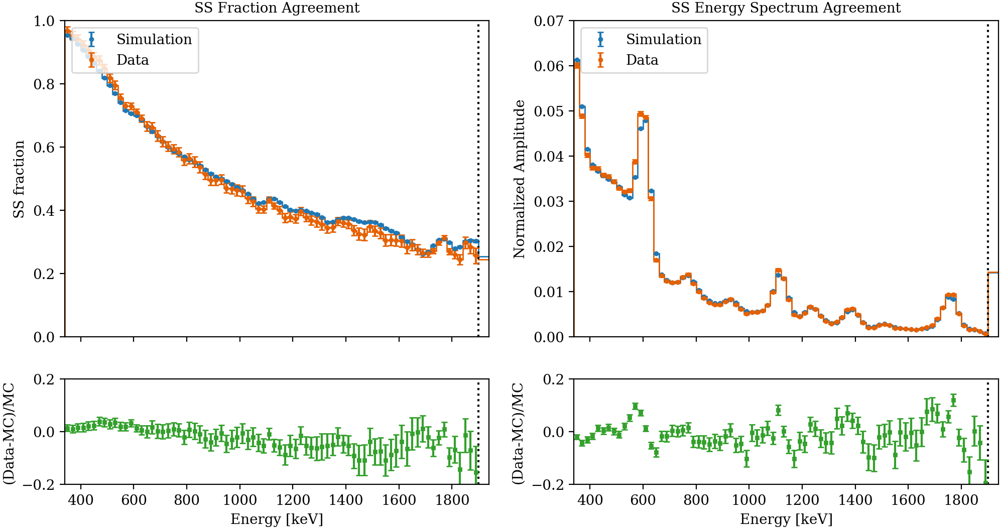

In [13]:
run_ssfrac(s="S2", th=340, source="Ra-226", roi = 900, xmax = 1900)

### Source Position 5 ###

{'S5': {'MeanSSerr': [(0.018043172534700235, 0.0013401953356621265)],
  'MaxSSerr': [0.04481567034609094],
  'MeanSSerr ROI': [(0.025992188194142226, 0.0012657858396687039)],
  'MaxSSerr ROI': [0.04481567034609094]}}

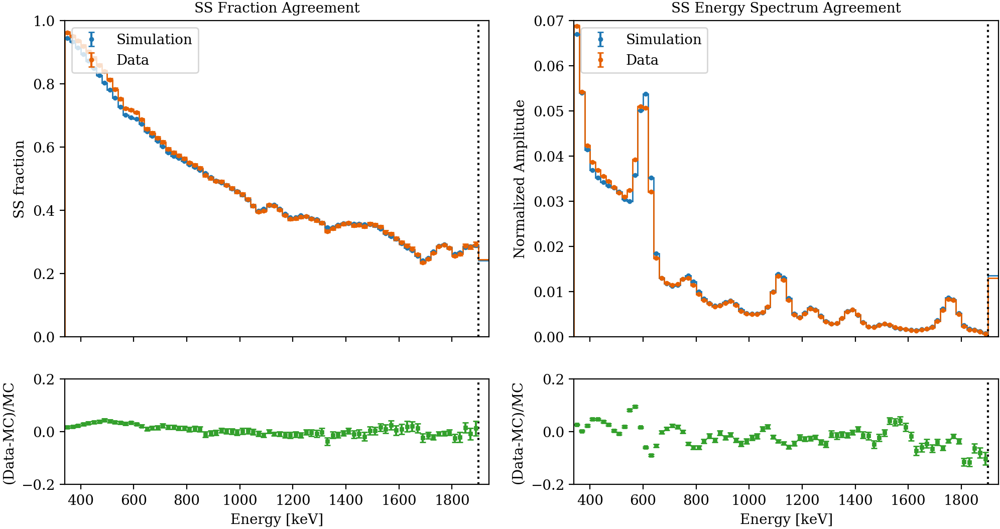

In [14]:
run_ssfrac(s="S5", th=340, source="Ra-226", roi = 900, xmax = 1900)

### Source Position 8 ###

{'S8': {'MeanSSerr': [(0.02724159630907073, 0.0046225885569470835)],
  'MaxSSerr': [0.11221769130896674],
  'MeanSSerr ROI': [(0.01980342160443044, 0.004423685534827155)],
  'MaxSSerr ROI': [0.03998390324880173]}}

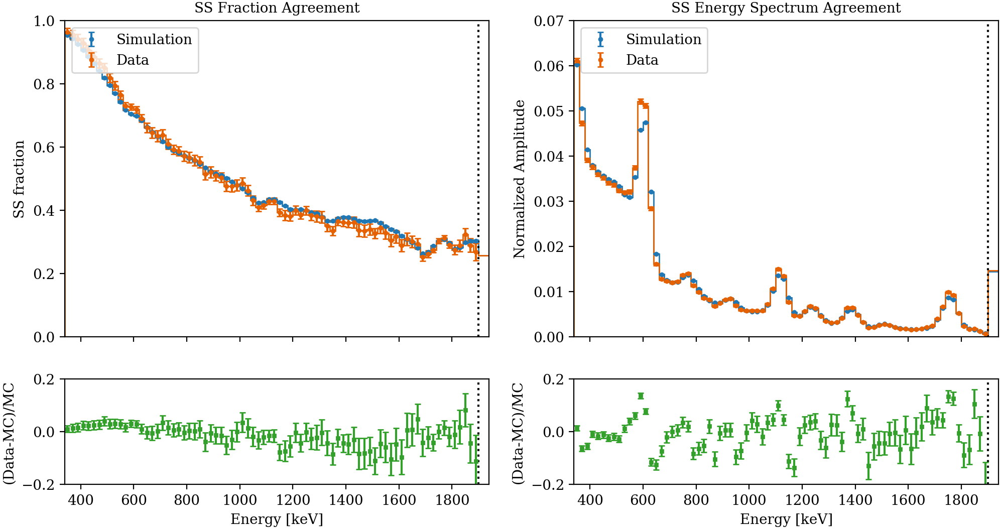

In [15]:
run_ssfrac(s="S8", th=340, source="Ra-226", roi = 900, xmax = 1900)

## 360 keV ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.03262515063895068, 0.00460773461764769)],
  'MaxSSerr': [0.15282937101509486],
  'MeanSSerr ROI': [(0.01922210429224076, 0.004450270425497019)],
  'MaxSSerr ROI': [0.03944992387015572]}}

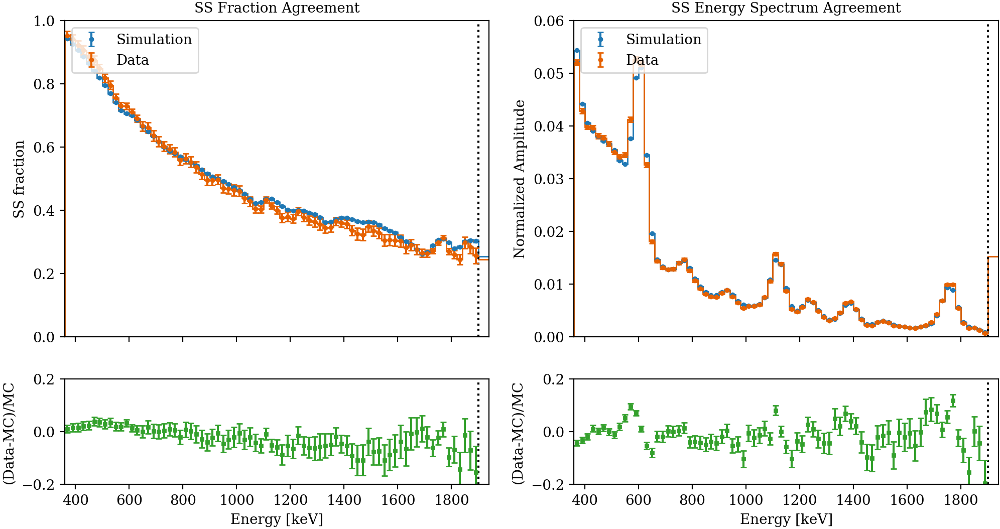

In [16]:
run_ssfrac(s="S2", th=360, source="Ra-226", roi = 900, xmax = 1900)

### Source Position 5 ###

{'S5': {'MeanSSerr': [(0.018001674010381902, 0.0013568319756172987)],
  'MaxSSerr': [0.044815341422567496],
  'MeanSSerr ROI': [(0.02636301514116435, 0.0013056433720532725)],
  'MaxSSerr ROI': [0.044815341422567496]}}

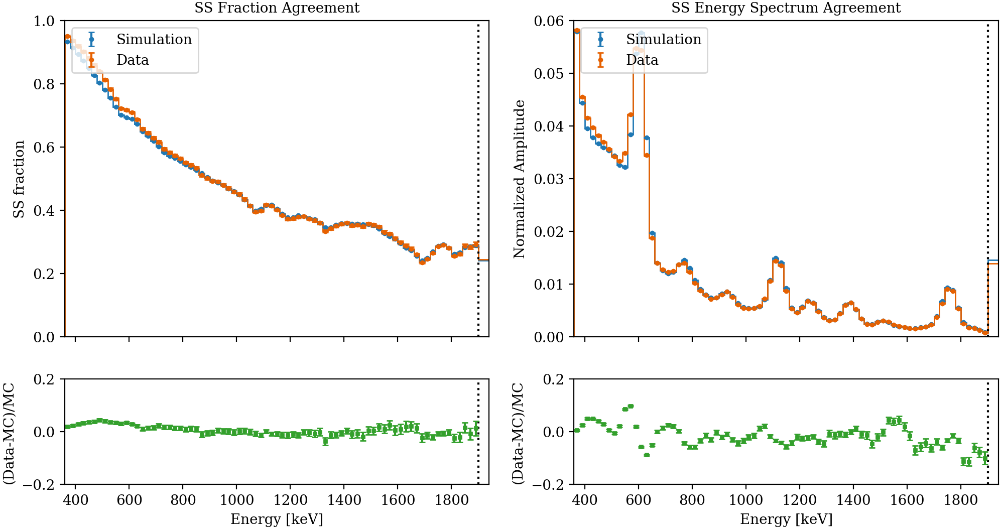

In [18]:
run_ssfrac(s="S5", th=360, source="Ra-226", roi = 900, xmax = 1900)

### Source Position 8 ###

{'S8': {'MeanSSerr': [(0.026317762577892853, 0.0045118380229218205)],
  'MaxSSerr': [0.11221060903832722],
  'MeanSSerr ROI': [(0.01887114720440507, 0.0041692934926716866)],
  'MaxSSerr ROI': [0.039984061980422335]}}

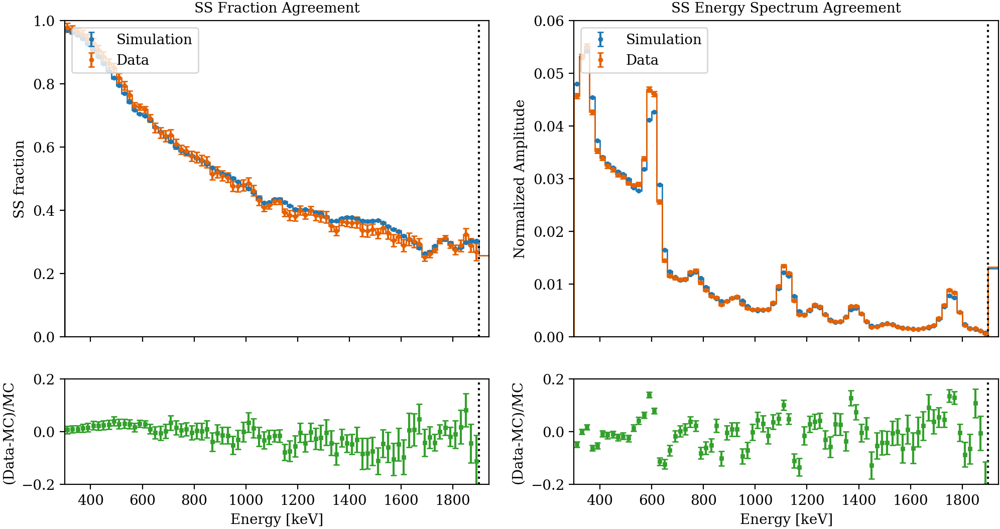

In [19]:
run_ssfrac(s="S8", th=300, source="Ra-226", roi = 900, xmax = 1900)

## 380 keV ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.03304796158860427, 0.004664432045255364)],
  'MaxSSerr': [0.15283008660298206],
  'MeanSSerr ROI': [(0.019382627150369636, 0.004585048567520949)],
  'MaxSSerr ROI': [0.03944948260934283]}}

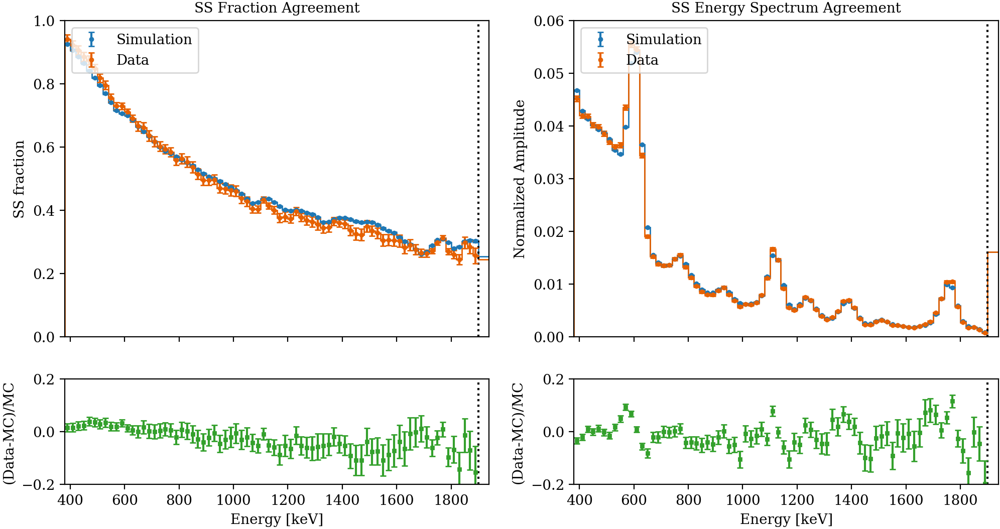

In [29]:
run_ssfrac(s="S2", th=380, source="Ra-226", roi = 900, xmax = 1900)

### Source Position 5 ###

{'S5': {'MeanSSerr': [(0.017845485967337003, 0.0013736393971742831)],
  'MaxSSerr': [0.04481541262746103],
  'MeanSSerr ROI': [(0.02649378745629622, 0.0013461308061832344)],
  'MaxSSerr ROI': [0.04481541262746103]}}

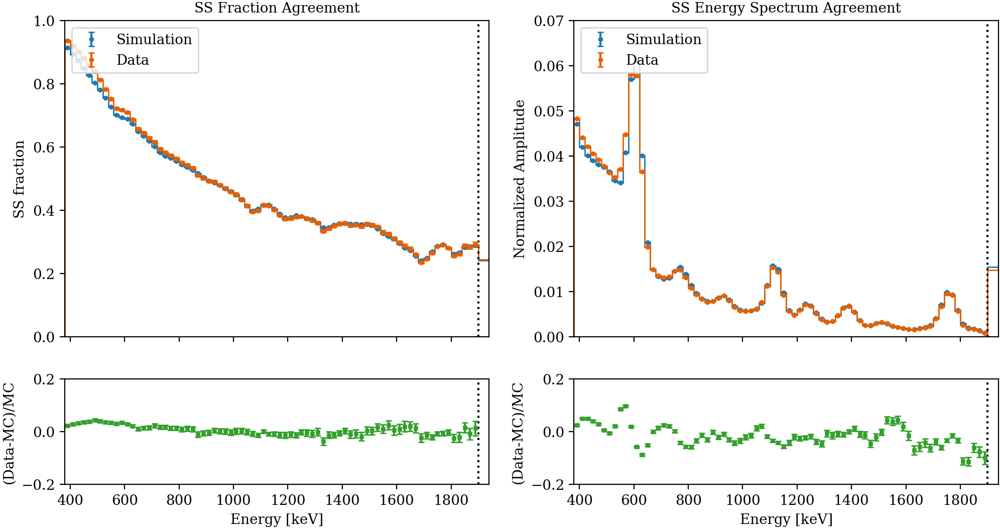

In [30]:
run_ssfrac(s="S5", th=380, source="Ra-226", roi = 900, xmax = 1900)

### Source Position 8 ###

{'S8': {'MeanSSerr': [(0.027878235820773888, 0.004736694118701157)],
  'MaxSSerr': [0.11221825841463577],
  'MeanSSerr ROI': [(0.02029596669249252, 0.004694951712533181)],
  'MaxSSerr ROI': [0.03998373613515865]}}

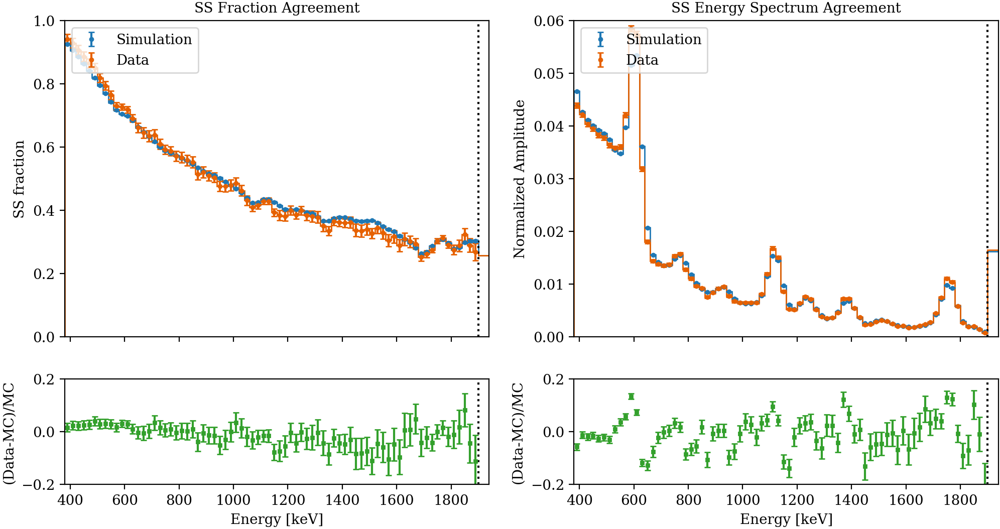

In [31]:
run_ssfrac(s="S8", th=380, source="Ra-226", roi = 900, xmax = 1900)

## 400 keV ##

### Source Position 2 ###

{'S2': {'MeanSSerr': [(0.03346202071202067, 0.004722328113938411)],
  'MaxSSerr': [0.15283727255263613],
  'MeanSSerr ROI': [(0.0195755249109382, 0.0047087763221648465)],
  'MaxSSerr ROI': [0.03945200176301726]}}

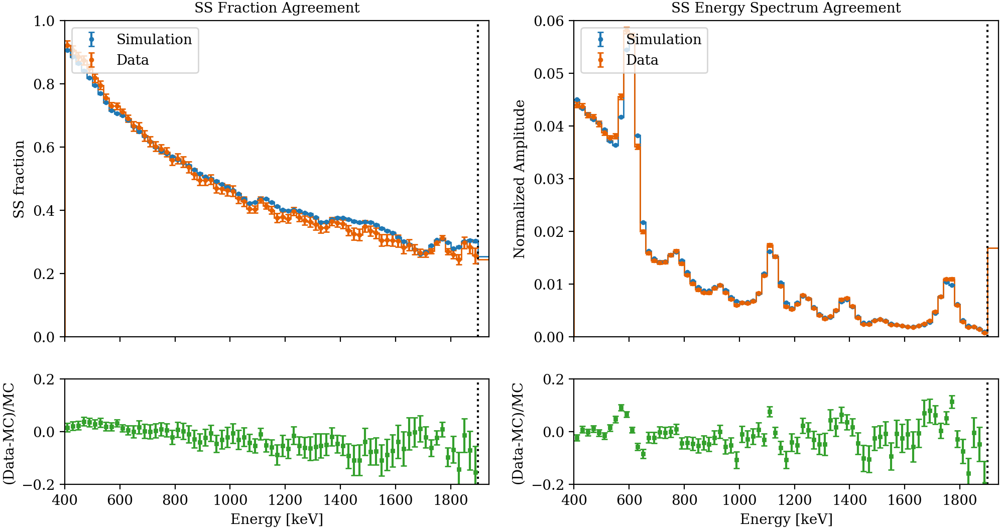

In [20]:
run_ssfrac(s="S2", th=400, source="Ra-226", roi = 900, xmax = 1900)

### Source Position 5 ###

{'S5': {'MeanSSerr': [(0.017556671680609533, 0.0013907880910041573)],
  'MaxSSerr': [0.04481562944881715],
  'MeanSSerr ROI': [(0.02575704706129648, 0.0013841932354707002)],
  'MaxSSerr ROI': [0.04481562944881715]}}

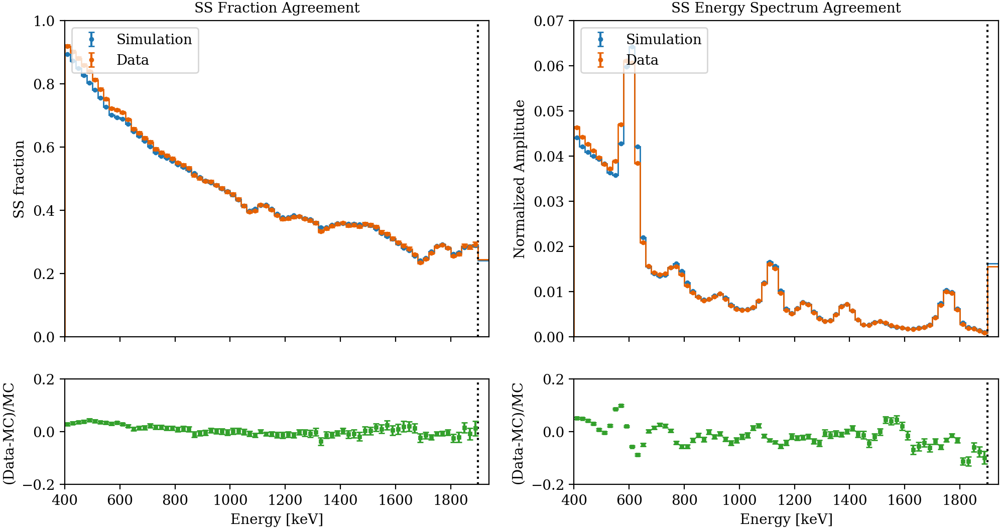

In [21]:
run_ssfrac(s="S5", th=400, source="Ra-226", roi = 900, xmax = 1900)

### Source Position 8 ###

{'S8': {'MeanSSerr': [(0.0279722183366848, 0.0047954512185487495)],
  'MaxSSerr': [0.11222245338603945],
  'MeanSSerr ROI': [(0.019896943016188134, 0.0048152016217638035)],
  'MaxSSerr ROI': [0.03998376406702785]}}

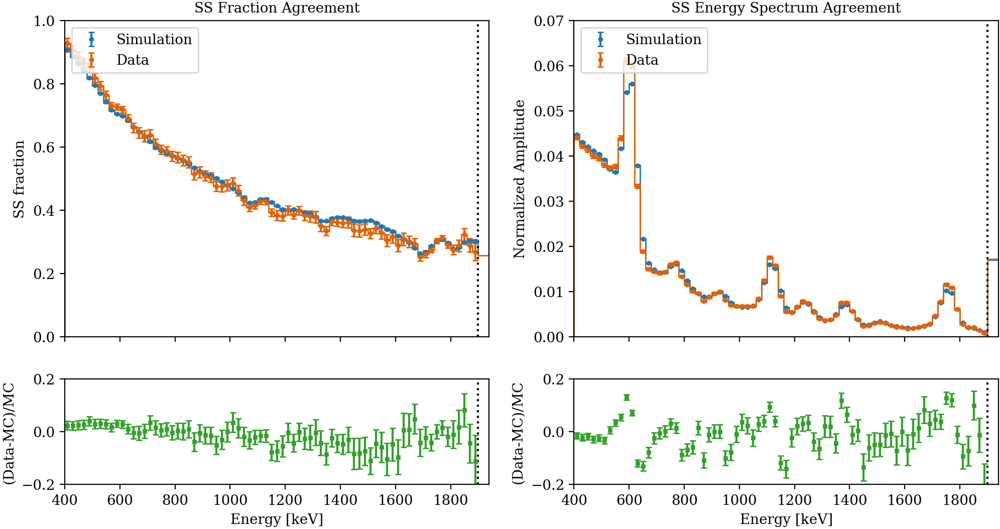

In [25]:
run_ssfrac(s="S8", th=400, source="Ra-226", roi = 900, xmax = 1900)

# Analysis #

Check on the rate agreement for threshold = 320 keV

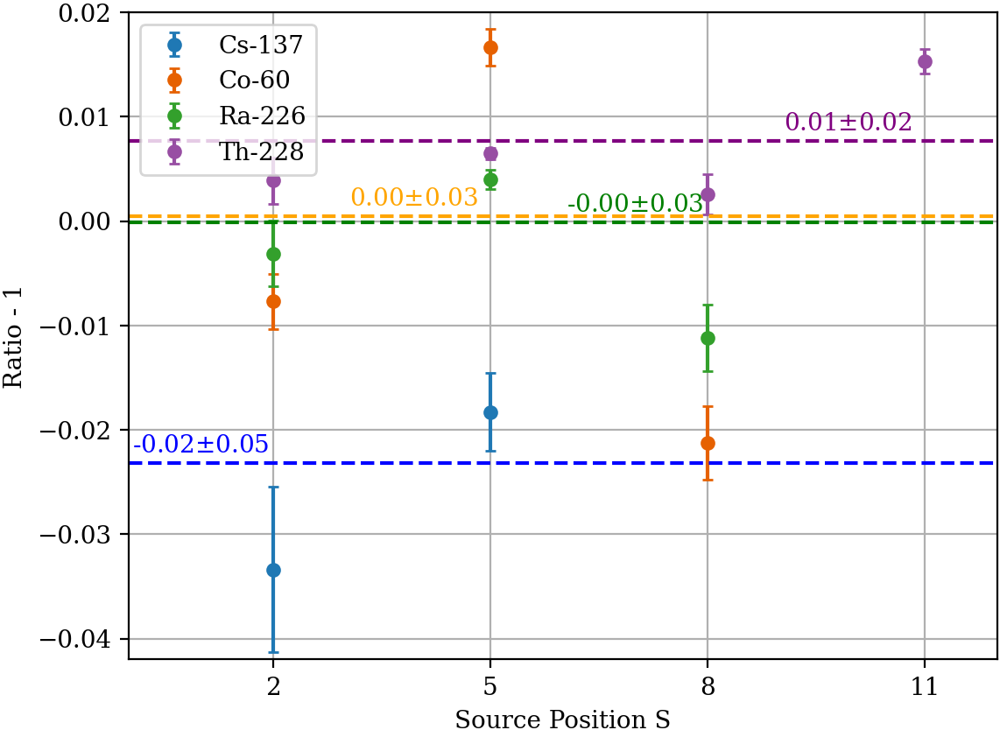

In [151]:
plt.errorbar([2,5],Cs_rates_320, yerr=Cs_rates_320_err, ls = "", marker=".",label="Cs-137")
plt.errorbar([2,5,8],Co_rates_320, yerr=Co_rates_320_err, ls = "", marker=".",label="Co-60")
plt.errorbar([2,5,8],Ra_rates_320, yerr=Ra_rates_320_err, ls = "", marker=".",label="Ra-226")
plt.errorbar([2,5,8,11],Th_rates_320, yerr=Th_rates_320_err, ls = "", marker=".",label="Th-228")
plt.xlim(0,12)
plt.ylim(-0.042,0.02)
plt.xticks([2,5,8,11])
plt.xlabel("Source Position S")
plt.ylabel("Ratio - 1")
xpos = 0.05
for r in [(Cs_rates_320,Cs_rates_320_err,"blue",),(Co_rates_320,Co_rates_320_err,"orange"),(Ra_rates_320,Ra_rates_320_err,"green"),(Th_rates_320,Th_rates_320_err,"purple")]:
    plt.axhline(np.average(r[0], weights=1/np.asarray(r[1])),ls="--",color=r[2])
    plt.text(xpos, np.average(r[0], weights=1/np.asarray(r[1]))+0.001,str('%.2f'%(np.average(r[0], weights=1/np.asarray(r[1]))))+"$\pm$"+str('%.2f'%(np.sqrt(sum(r[1]))/len(r[1]))), color=r[2])
    xpos += 3
plt.legend()
plt.grid(True)